In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
import numpy as np
import warnings
warnings.filterwarnings("ignore")
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import pandas as pd
from kmodes.kprototypes import KPrototypes
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, accuracy_score, confusion_matrix



In [2]:
wells=pd.read_csv('Delaware_Wells_filtered_2.csv')

In [3]:
wells.shape

(16685, 103)

## Exploratory Data Analysis

### Features for Rock/Geology

In [4]:
rock = wells[['Payzone_FT','GammaRay_API', 'BulkDensity_GPerCC','Resistivity_OHMSM', 'DensityPorosity_PCT',
              'EffectivePorosity_PCT', 'ClayVolume_PCT', 'NonClayVolume_PCT', 'WaterSaturation_PCT', 'PhiH_FT', 
              'HCPV_PCT', 'HeightOfHCPV_FT', 'TotalOrganicCarbon_WTPCT']]

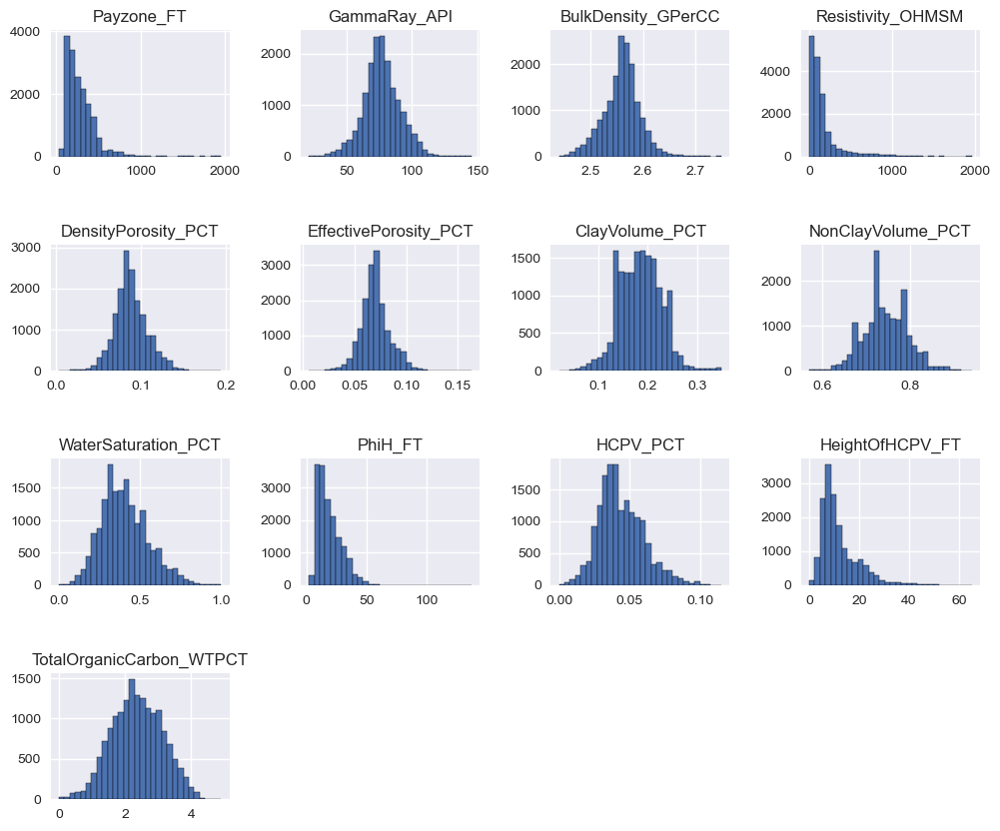

In [5]:
plt.style.use('seaborn')

rock.hist(figsize=(12, 10), bins=30, edgecolor="black")
plt.subplots_adjust(hspace=0.7, wspace=0.4)

### Target Variable - Ultimate Hydrocarbon Recovery - Oil, Gas and Combined Oil/Gas

In [6]:
target_eur=wells[['EURWH_MBOE', 'OilEURWH_MBBL', 'GasEURWH_BCF']]

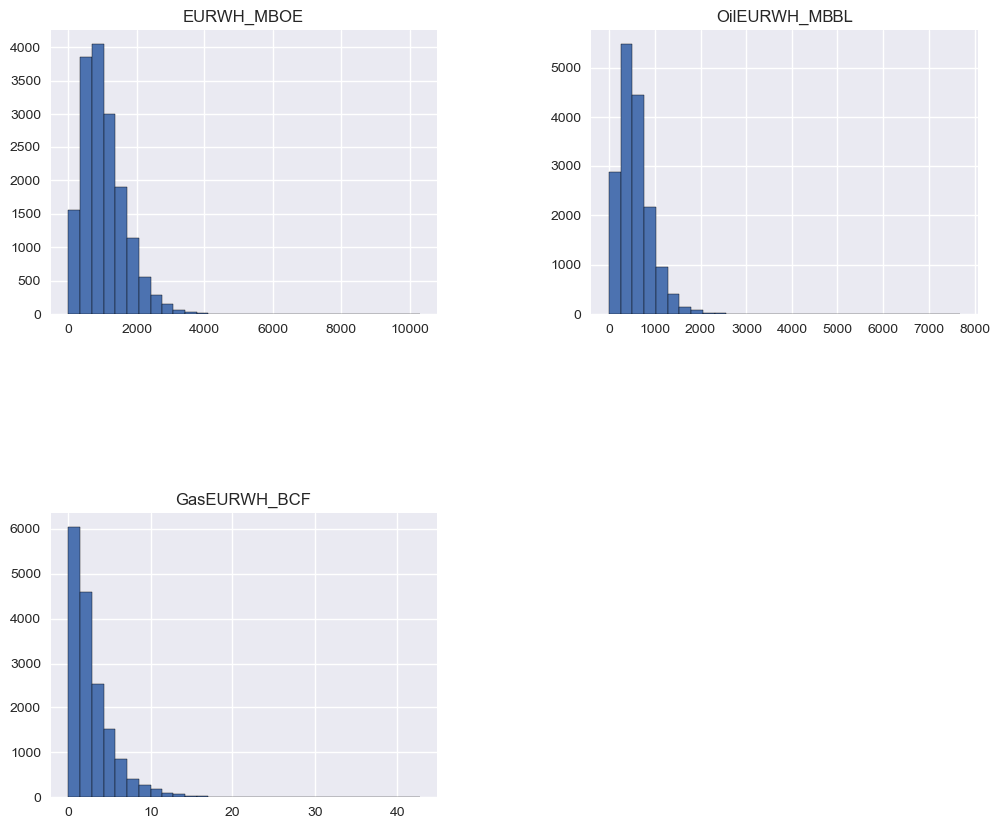

In [7]:
plt.style.use('seaborn')

target_eur.hist(figsize=(12, 10), bins=30, edgecolor="black")
plt.subplots_adjust(hspace=0.7, wspace=0.4)

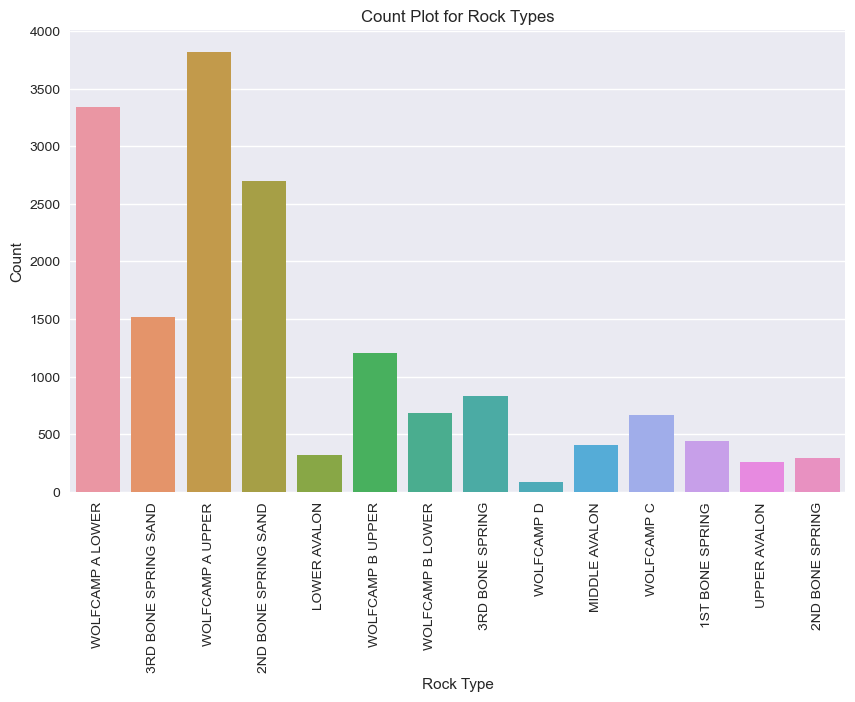

In [8]:
plt.figure(figsize=(10, 6))  # Adjust the size as needed
sns.countplot(x='ENVInterval', data=wells)

plt.title('Count Plot for Rock Types')
plt.xlabel('Rock Type')
plt.ylabel('Count')
plt.xticks(rotation=90)  # Rotates the x-axis labels to prevent overlap

plt.show()

In [9]:
wells['ENVProdWellType'].unique()

array(['LIQUIDS RICH GAS (10-40% WH LIQUIDS)', 'OIL (40%+ WH LIQUIDS)',
       'DRY GAS (0-1% WH LIQUIDS)', 'WET GAS (1-10% WH LIQUIDS)'],
      dtype=object)

In [10]:
wells['ENVProdWellType']= wells['ENVProdWellType'].replace({'LIQUIDS RICH GAS (10-40% WH LIQUIDS)': 'CONDENSATE',
                                                           'OIL (40%+ WH LIQUIDS)': 'OIL',
                                                           'DRY GAS (0-1% WH LIQUIDS)':'DRY GAS',
                                                           'WET GAS (1-10% WH LIQUIDS)':'WET GAS'})

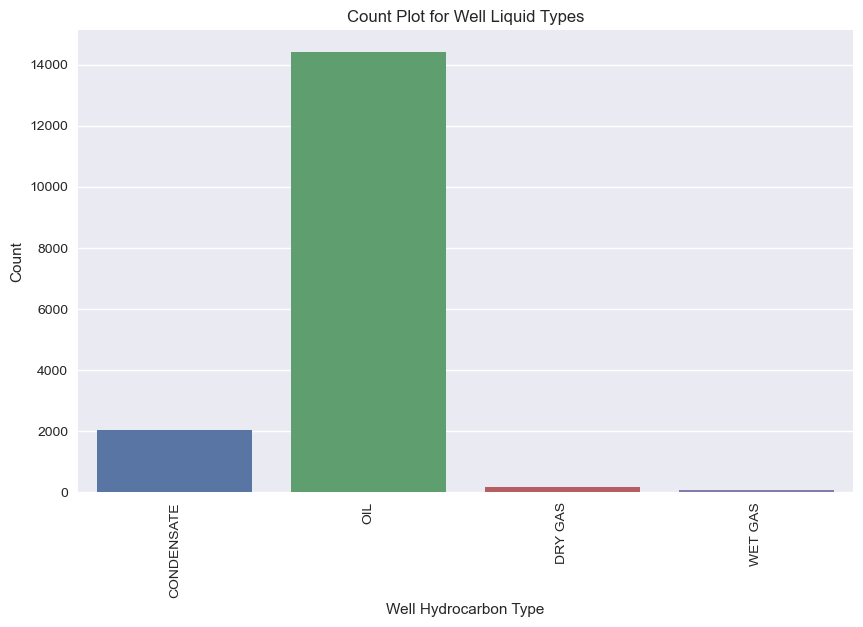

In [11]:
plt.figure(figsize=(10, 6))  # Adjust the size as needed
sns.countplot(x='ENVProdWellType', data=wells)

plt.title('Count Plot for Well Liquid Types')
plt.xlabel('Well Hydrocarbon Type')
plt.ylabel('Count')
plt.xticks(rotation=90)  # Rotates the x-axis labels to prevent overlap

plt.show()

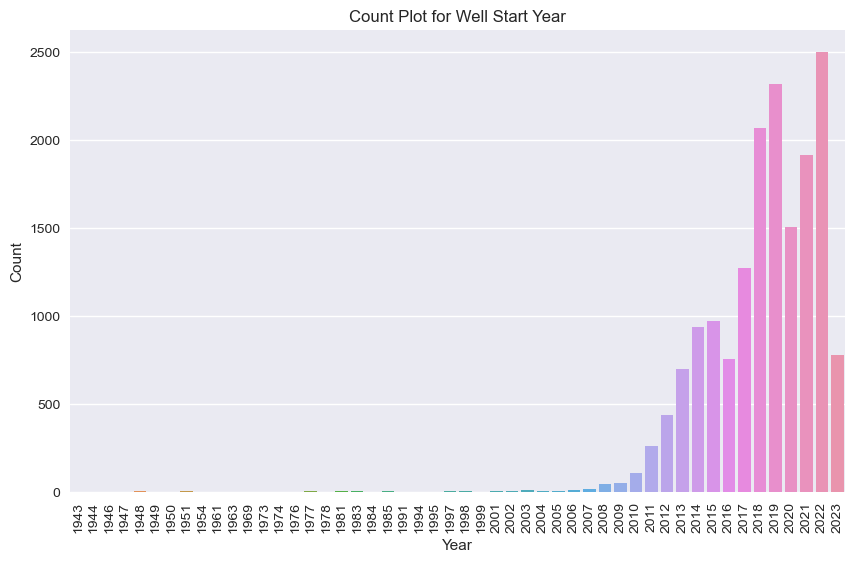

In [12]:
plt.figure(figsize=(10, 6))  # Adjust the size as needed
sns.countplot(x='Vintage', data=wells)

plt.title('Count Plot for Well Start Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation=90)  # Rotates the x-axis labels to prevent overlap

plt.show()

In [13]:
wells2=wells[wells['Vintage']>2009]

In [14]:
wells2.shape

(16505, 103)

### Cross Plot of First 3 Month Production Data

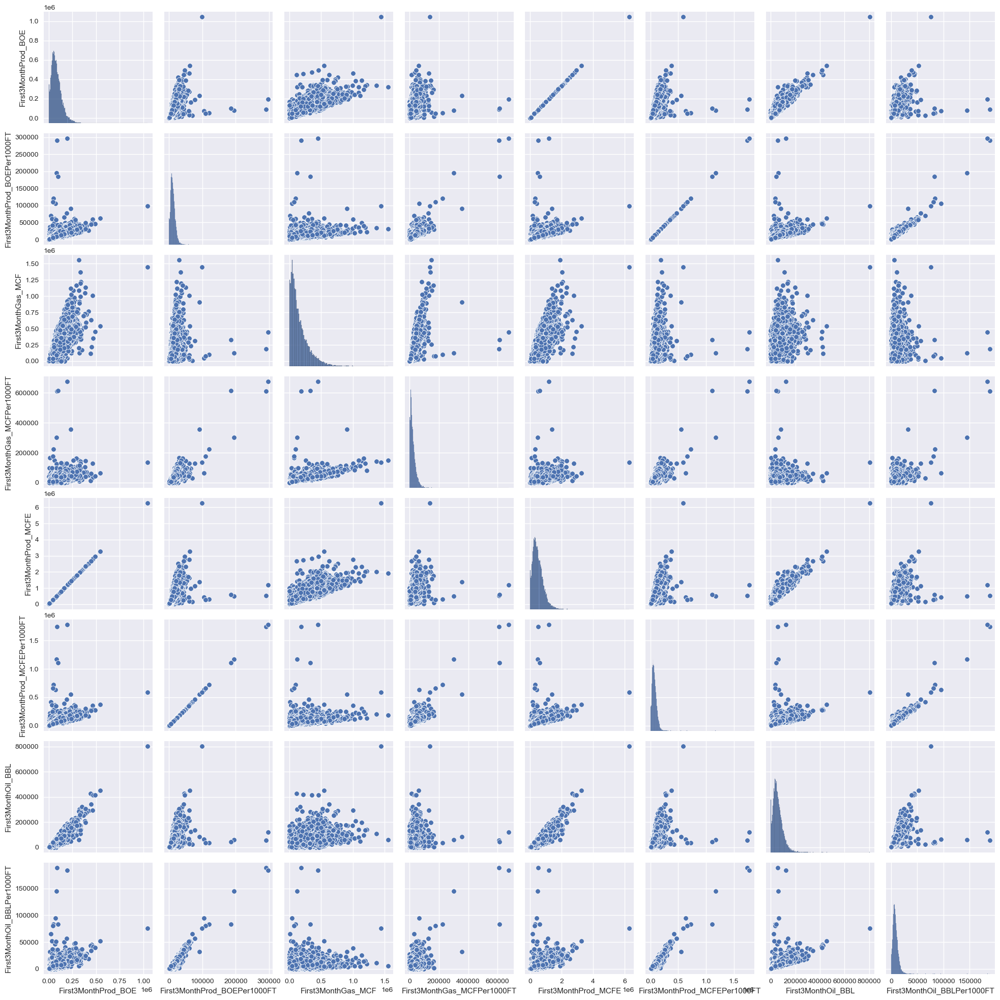

In [15]:
sns.pairplot(wells2[['First3MonthProd_BOE', 'First3MonthProd_BOEPer1000FT', 'First3MonthGas_MCF',
                 'First3MonthGas_MCFPer1000FT','First3MonthProd_MCFE', 'First3MonthProd_MCFEPer1000FT',
                 'First3MonthOil_BBL', 'First3MonthOil_BBLPer1000FT']])

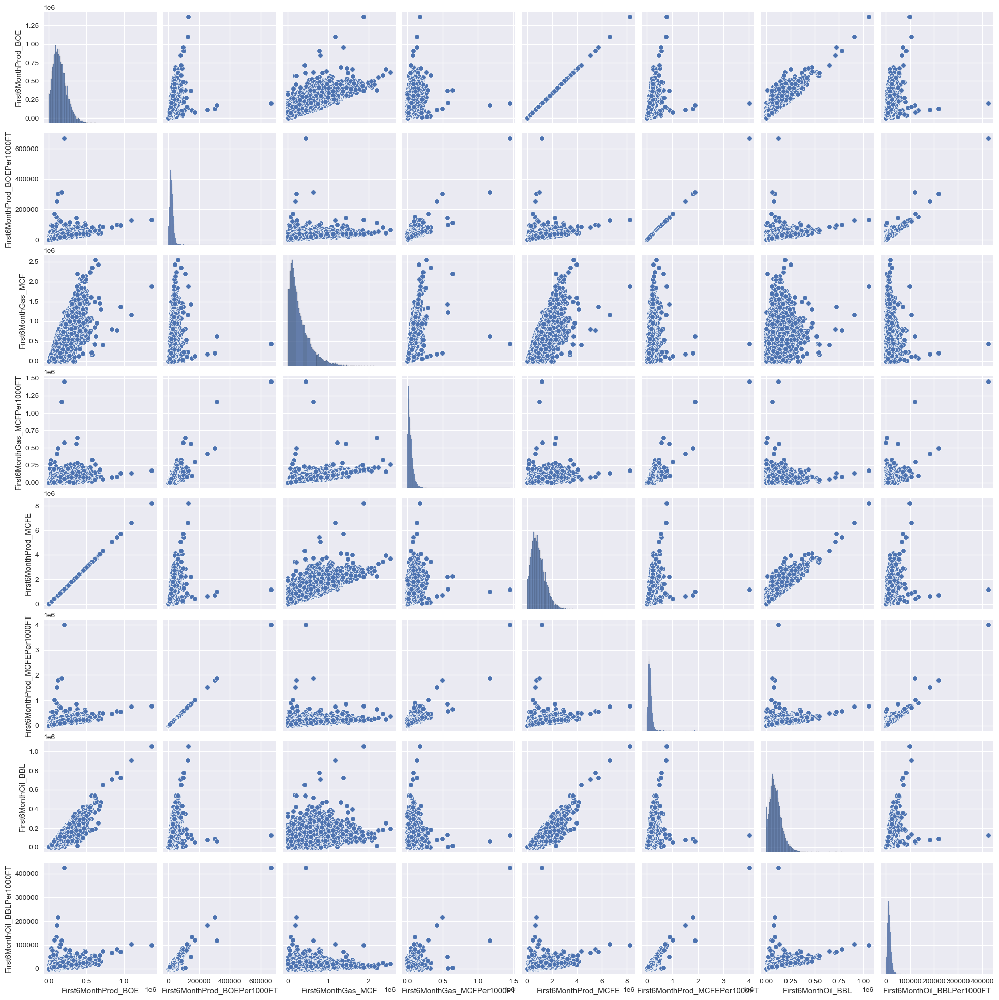

In [16]:
sns.pairplot(wells[['First6MonthProd_BOE', 'First6MonthProd_BOEPer1000FT', 'First6MonthGas_MCF',
                 'First6MonthGas_MCFPer1000FT','First6MonthProd_MCFE', 'First6MonthProd_MCFEPer1000FT',
                 'First6MonthOil_BBL', 'First6MonthOil_BBLPer1000FT']])

In [17]:
wells2= wells2.drop(columns=['First3MonthProd_MCFE', 'First3MonthProd_MCFEPer1000FT', 'First6MonthProd_MCFE',
                             'First6MonthProd_MCFEPer1000FT','First9MonthProd_MCFE', 'First9MonthProd_MCFEPer1000FT',
                             'First12MonthProd_MCFE', 'First12MonthProd_MCFEPer1000FT'])

In [18]:
wells2= wells2.drop(columns=['PeakProd_MCFE', 'PeakProd_MCFEPer1000FT', 'CumProd_MCFE','CumProd_MCFEPer1000FT'])

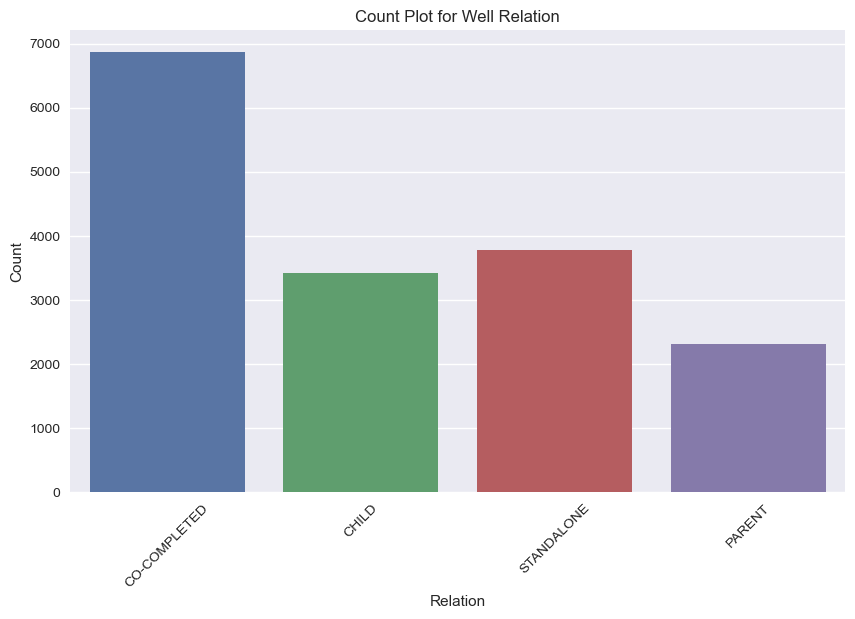

In [19]:
plt.figure(figsize=(10, 6))  # Adjust the size as needed
sns.countplot(x='ParentChildSameZone', data=wells2)

plt.title('Count Plot for Well Relation')
plt.xlabel('Relation')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotates the x-axis labels to prevent overlap

plt.show()

### Create dataframe with static and spatial feature

In [20]:
wells_filtered = wells2[['ENVProdWellType','ENVInterval','ENVSpacingAssumption','Latitude','Longitude','TVD_FT','Vintage',
                         'LateralLength_FT','ProppantIntensity_LBSPerFT','FluidIntensity_BBLPerFT','ParentChildSameZone',
                         'WellDensitySameZone','WellsPerSectionSameZone','GasShrink_PCT','NGLYield_BBLPerMMCF',
                         'GenericDrainage_AC','Payzone_FT','GammaRay_API','BulkDensity_GPerCC','Resistivity_OHMSM',
                         'DensityPorosity_PCT','EffectivePorosity_PCT', 'ClayVolume_PCT', 'NonClayVolume_PCT', 
                         'WaterSaturation_PCT', 'PhiH_FT','HCPV_PCT', 'HeightOfHCPV_FT', 'TotalOrganicCarbon_WTPCT',
                         'EURWH_MBOE','OilEURWH_MBBL','GasEURWH_BCF']]



In [21]:
print(wells_filtered.isna().sum())
dropna = ['ENVSpacingAssumption', 'WellDensitySameZone', 'GasShrink_PCT', 'NGLYield_BBLPerMMCF',
          'GenericDrainage_AC'  ]


ENVProdWellType                  0
ENVInterval                    112
ENVSpacingAssumption          3908
Latitude                         0
Longitude                        0
TVD_FT                          80
Vintage                          0
LateralLength_FT                14
ProppantIntensity_LBSPerFT    1544
FluidIntensity_BBLPerFT       1463
ParentChildSameZone            130
WellDensitySameZone           3908
WellsPerSectionSameZone        130
GasShrink_PCT                 1016
NGLYield_BBLPerMMCF           1016
GenericDrainage_AC            1018
Payzone_FT                     110
GammaRay_API                   110
BulkDensity_GPerCC             110
Resistivity_OHMSM              110
DensityPorosity_PCT            110
EffectivePorosity_PCT          110
ClayVolume_PCT                 110
NonClayVolume_PCT              110
WaterSaturation_PCT            110
PhiH_FT                        110
HCPV_PCT                       110
HeightOfHCPV_FT                110
TotalOrganicCarbon_W

In [22]:
well_dropna=wells_filtered.drop(columns=dropna)
well_dropna.shape

(16505, 27)

In [23]:
well_dropna.isna().sum()

ENVProdWellType                  0
ENVInterval                    112
Latitude                         0
Longitude                        0
TVD_FT                          80
Vintage                          0
LateralLength_FT                14
ProppantIntensity_LBSPerFT    1544
FluidIntensity_BBLPerFT       1463
ParentChildSameZone            130
WellsPerSectionSameZone        130
Payzone_FT                     110
GammaRay_API                   110
BulkDensity_GPerCC             110
Resistivity_OHMSM              110
DensityPorosity_PCT            110
EffectivePorosity_PCT          110
ClayVolume_PCT                 110
NonClayVolume_PCT              110
WaterSaturation_PCT            110
PhiH_FT                        110
HCPV_PCT                       110
HeightOfHCPV_FT                110
TotalOrganicCarbon_WTPCT       110
EURWH_MBOE                       0
OilEURWH_MBBL                    0
GasEURWH_BCF                     0
dtype: int64

In [24]:
well_dropna = well_dropna.dropna(subset = ['ENVInterval','ParentChildSameZone', 'WellsPerSectionSameZone'])

In [25]:
well_dropna.shape

(16295, 27)

In [26]:
well_dropna.isna().sum()

ENVProdWellType                  0
ENVInterval                      0
Latitude                         0
Longitude                        0
TVD_FT                           4
Vintage                          0
LateralLength_FT                 3
ProppantIntensity_LBSPerFT    1456
FluidIntensity_BBLPerFT       1366
ParentChildSameZone              0
WellsPerSectionSameZone          0
Payzone_FT                       0
GammaRay_API                     0
BulkDensity_GPerCC               0
Resistivity_OHMSM                0
DensityPorosity_PCT              0
EffectivePorosity_PCT            0
ClayVolume_PCT                   0
NonClayVolume_PCT                0
WaterSaturation_PCT              0
PhiH_FT                          0
HCPV_PCT                         0
HeightOfHCPV_FT                  0
TotalOrganicCarbon_WTPCT         0
EURWH_MBOE                       0
OilEURWH_MBBL                    0
GasEURWH_BCF                     0
dtype: int64

In [27]:
well_dropna = well_dropna.dropna(subset = ['TVD_FT','LateralLength_FT', 'WellsPerSectionSameZone',
                                           'ProppantIntensity_LBSPerFT', 'FluidIntensity_BBLPerFT'])

In [28]:
well_dropna.shape

(14425, 27)

In [29]:
well_dropna.isna().sum()

ENVProdWellType               0
ENVInterval                   0
Latitude                      0
Longitude                     0
TVD_FT                        0
Vintage                       0
LateralLength_FT              0
ProppantIntensity_LBSPerFT    0
FluidIntensity_BBLPerFT       0
ParentChildSameZone           0
WellsPerSectionSameZone       0
Payzone_FT                    0
GammaRay_API                  0
BulkDensity_GPerCC            0
Resistivity_OHMSM             0
DensityPorosity_PCT           0
EffectivePorosity_PCT         0
ClayVolume_PCT                0
NonClayVolume_PCT             0
WaterSaturation_PCT           0
PhiH_FT                       0
HCPV_PCT                      0
HeightOfHCPV_FT               0
TotalOrganicCarbon_WTPCT      0
EURWH_MBOE                    0
OilEURWH_MBBL                 0
GasEURWH_BCF                  0
dtype: int64

In [30]:
wells_data = well_dropna

In [31]:
Xdata = wells_data.drop(columns = ['EURWH_MBOE', 'OilEURWH_MBBL', 'GasEURWH_BCF'])
ydata = wells_data[['EURWH_MBOE', 'OilEURWH_MBBL', 'GasEURWH_BCF']]

In [32]:
print(Xdata['ENVProdWellType'].unique())
print(Xdata['ENVInterval'].unique())
print(Xdata['ParentChildSameZone'].unique())


['CONDENSATE' 'OIL' 'DRY GAS' 'WET GAS']
['WOLFCAMP A LOWER' '3RD BONE SPRING SAND' 'WOLFCAMP A UPPER'
 '2ND BONE SPRING SAND' 'LOWER AVALON' 'WOLFCAMP B UPPER'
 'WOLFCAMP B LOWER' '3RD BONE SPRING' 'WOLFCAMP D' 'WOLFCAMP C'
 '1ST BONE SPRING' 'UPPER AVALON' 'MIDDLE AVALON' '2ND BONE SPRING']
['CO-COMPLETED' 'CHILD' 'STANDALONE' 'PARENT']


In [33]:
categorical = ['ENVProdWellType','ENVInterval','ParentChildSameZone']
numerical = ['ENVSpacingAssumption','Latitude','Longitude','TVD_FT','Vintage','LateralLength_FT','ProppantIntensity_LBSPerFT','FluidIntensity_BBLPerFT',
           'WellDensitySameZone','WellsPerSectionSameZone','GasShrink_PCT','NGLYield_BBLPerMMCF','GenericDrainage_AC','Payzone_FT','GammaRay_API',
           'BulkDensity_GPerCC','Resistivity_OHMSM', 'DensityPorosity_PCT','EffectivePorosity_PCT', 'ClayVolume_PCT', 'NonClayVolume_PCT', 'WaterSaturation_PCT', 'PhiH_FT',
           'HCPV_PCT', 'HeightOfHCPV_FT', 'TotalOrganicCarbon_WTPCT']

for feat in categorical:
    one_hot = pd.get_dummies(Xdata[feat])
    Xdata = Xdata.drop(feat, axis = 1)
    Xdata = Xdata.join(one_hot)

print(Xdata.shape)
print(Xdata.columns)

# Displaying the original and the transformed dataframes
Xdata.head(3)

(14425, 43)
Index(['Latitude', 'Longitude', 'TVD_FT', 'Vintage', 'LateralLength_FT',
       'ProppantIntensity_LBSPerFT', 'FluidIntensity_BBLPerFT',
       'WellsPerSectionSameZone', 'Payzone_FT', 'GammaRay_API',
       'BulkDensity_GPerCC', 'Resistivity_OHMSM', 'DensityPorosity_PCT',
       'EffectivePorosity_PCT', 'ClayVolume_PCT', 'NonClayVolume_PCT',
       'WaterSaturation_PCT', 'PhiH_FT', 'HCPV_PCT', 'HeightOfHCPV_FT',
       'TotalOrganicCarbon_WTPCT', 'CONDENSATE', 'DRY GAS', 'OIL', 'WET GAS',
       '1ST BONE SPRING', '2ND BONE SPRING', '2ND BONE SPRING SAND',
       '3RD BONE SPRING', '3RD BONE SPRING SAND', 'LOWER AVALON',
       'MIDDLE AVALON', 'UPPER AVALON', 'WOLFCAMP A LOWER', 'WOLFCAMP A UPPER',
       'WOLFCAMP B LOWER', 'WOLFCAMP B UPPER', 'WOLFCAMP C', 'WOLFCAMP D',
       'CHILD', 'CO-COMPLETED', 'PARENT', 'STANDALONE'],
      dtype='object')


,Latitude,Longitude,TVD_FT,Vintage,LateralLength_FT,ProppantIntensity_LBSPerFT,FluidIntensity_BBLPerFT,WellsPerSectionSameZone,Payzone_FT,GammaRay_API,...,WOLFCAMP A LOWER,WOLFCAMP A UPPER,WOLFCAMP B LOWER,WOLFCAMP B UPPER,WOLFCAMP C,WOLFCAMP D,CHILD,CO-COMPLETED,PARENT,STANDALONE
0,31.685214,-103.989074,9899.0,2022,7887.0,2535.0,58.0,2.0,169.0,68.94,...,True,False,False,False,False,False,False,True,False,False
1,31.709190,-104.114174,9146.0,2018,7408.0,2122.0,61.0,3.0,177.0,64.91,...,True,False,False,False,False,False,True,False,False,False
2,31.497941,-103.145184,10783.0,2019,10706.0,2671.0,43.0,3.0,120.0,86.17,...,False,False,False,False,False,False,False,True,False,False


In [34]:
column = ['CONDENSATE', 'DRY GAS', 'OIL', 'WET GAS',
       '1ST BONE SPRING', '2ND BONE SPRING', '2ND BONE SPRING SAND',
       '3RD BONE SPRING', '3RD BONE SPRING SAND', 'LOWER AVALON',
       'MIDDLE AVALON', 'UPPER AVALON', 'WOLFCAMP A LOWER', 'WOLFCAMP A UPPER',
       'WOLFCAMP B LOWER', 'WOLFCAMP B UPPER', 'WOLFCAMP C', 'WOLFCAMP D',
       'CHILD', 'CO-COMPLETED', 'PARENT', 'STANDALONE']
for col in column:
    Xdata[col]=Xdata[col].map({True:1, False:0})
Xdata.head()

,Latitude,Longitude,TVD_FT,Vintage,LateralLength_FT,ProppantIntensity_LBSPerFT,FluidIntensity_BBLPerFT,WellsPerSectionSameZone,Payzone_FT,GammaRay_API,...,WOLFCAMP A LOWER,WOLFCAMP A UPPER,WOLFCAMP B LOWER,WOLFCAMP B UPPER,WOLFCAMP C,WOLFCAMP D,CHILD,CO-COMPLETED,PARENT,STANDALONE
0,31.685214,-103.989074,9899.0,2022,7887.0,2535.0,58.0,2.0,169.0,68.94,...,1,0,0,0,0,0,0,1,0,0
1,31.709190,-104.114174,9146.0,2018,7408.0,2122.0,61.0,3.0,177.0,64.91,...,1,0,0,0,0,0,1,0,0,0
2,31.497941,-103.145184,10783.0,2019,10706.0,2671.0,43.0,3.0,120.0,86.17,...,0,0,0,0,0,0,0,1,0,0
3,31.796166,-103.334038,12248.0,2020,4644.0,1999.0,34.0,1.0,126.0,91.64,...,0,1,0,0,0,0,0,0,0,1
4,31.724241,-103.845781,10500.0,2022,10151.0,1828.0,28.0,2.0,154.0,88.95,...,0,1,0,0,0,0,0,1,0,0


In [35]:
#Dataframe for scatter plot
wells_scat = wells_data
wells_scat['size_']=wells_data['ENVProdWellType'].map({'DRY GAS':1,'WET GAS':2,'CONDENSATE':3, 'OIL':4})

In [36]:
min(wells_scat['size_'])

1

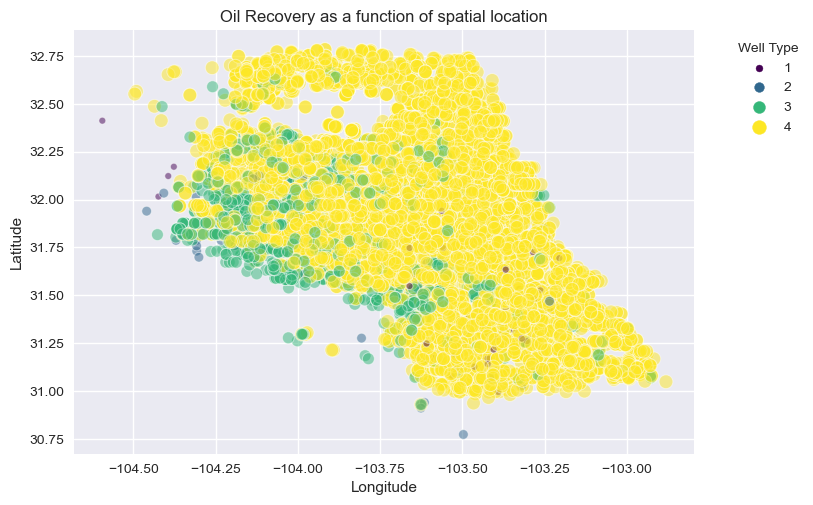

In [37]:
# Create a scatter plot
scatter = sns.scatterplot(x='Longitude', y='Latitude', 
                size='size_', hue='size_', 
                data=wells_scat,palette="viridis", alpha=0.5,)

# Remove the original size legend
scatter.legend_.remove()

# Create a custom legend
handles, labels = scatter.get_legend_handles_labels()
# Get the handles and labels for the hue legend
hue_handles = handles[:len(wells_scat['ENVProdWellType'].unique())]
hue_labels = labels[:len(wells_scat['ENVProdWellType'].unique())]
# Create the legend for hue
plt.legend(hue_handles, hue_labels, title='Well Type', bbox_to_anchor=(1.05, 1), loc=2)
plt.title("Oil Recovery as a function of spatial location")
plt.show()

#plt.legend(title="Well Type", bbox_to_anchor=(1.05, 0.95), loc="upper left")
#;

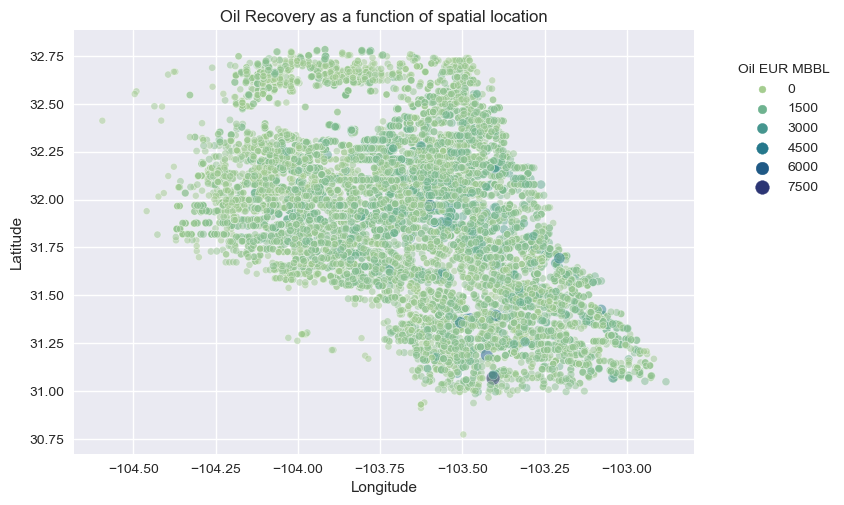

In [96]:
# visualizing the spatial distribution of Wells
sns.scatterplot(
    data=wells_data,
    x="Longitude",
    y="Latitude",
    size="OilEURWH_MBBL",
    hue="OilEURWH_MBBL",
    palette="crest",
    alpha=0.5,
)
plt.legend(title="Oil EUR MBBL", bbox_to_anchor=(1.05, 0.95), loc="upper left")
plt.title("Oil Recovery as a function of spatial location");

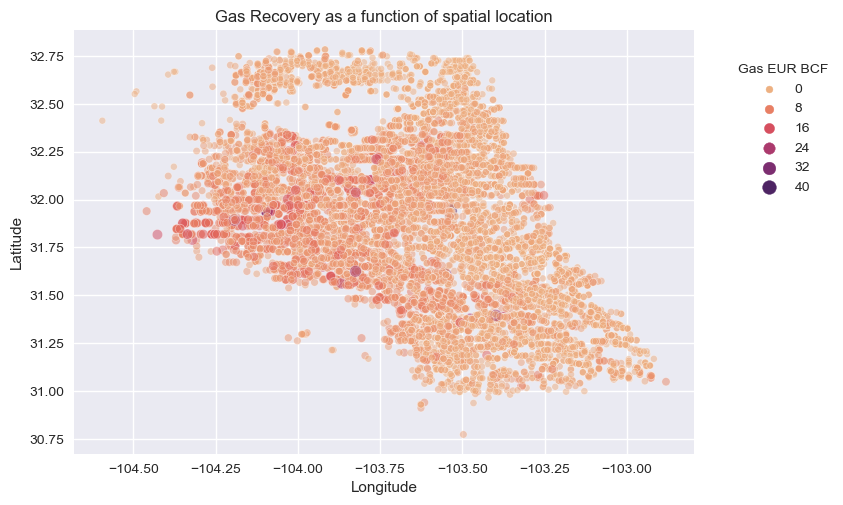

In [98]:
# visualizing the spatial distribution of Wells
sns.scatterplot(
    data=wells_data,
    x="Longitude",
    y="Latitude",
    size="GasEURWH_BCF",
    hue="GasEURWH_BCF",
    palette="flare",
    alpha=0.5,
)
plt.legend(title="Gas EUR BCF", bbox_to_anchor=(1.05, 0.95), loc="upper left")
plt.title("Gas Recovery as a function of spatial location");

In [77]:
wells_data_log=wells_data.loc[:,:]
wells_data_log['Log_Oil_EUR']= np.log(wells_data_log['OilEURWH_MBBL'] + 1)
wells_data_log['Log_Gas_EUR']= np.log(wells_data_log['GasEURWH_BCF'] + 1)
wells_data_log['Log_BOE_EUR']= np.log(wells_data_log['EURWH_MBOE'] + 1)

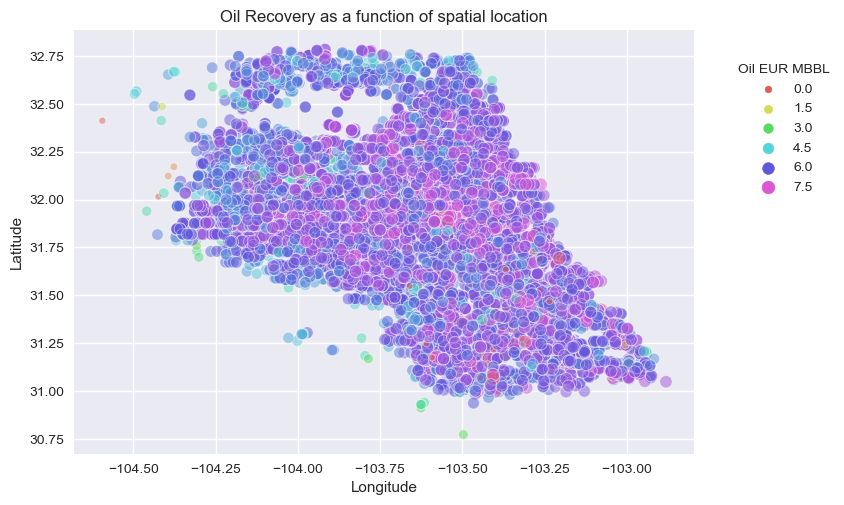

In [79]:
# visualizing the spatial distribution of Wells
sns.scatterplot(
    data=wells_data_log,
    x="Longitude",
    y="Latitude",
    size="Log_Oil_EUR",
    hue="Log_Oil_EUR",
    palette="hls",
    alpha=0.5,
)
plt.legend(title="Oil EUR MBBL", bbox_to_anchor=(1.05, 0.95), loc="upper left")
plt.title("Oil Recovery as a function of spatial location");

In [39]:
Xpca = wells_data.drop(columns=['EURWH_MBOE', 'OilEURWH_MBBL',
       'GasEURWH_BCF', 'size_'])
Yoilpca = wells_data[['OilEURWH_MBBL']]

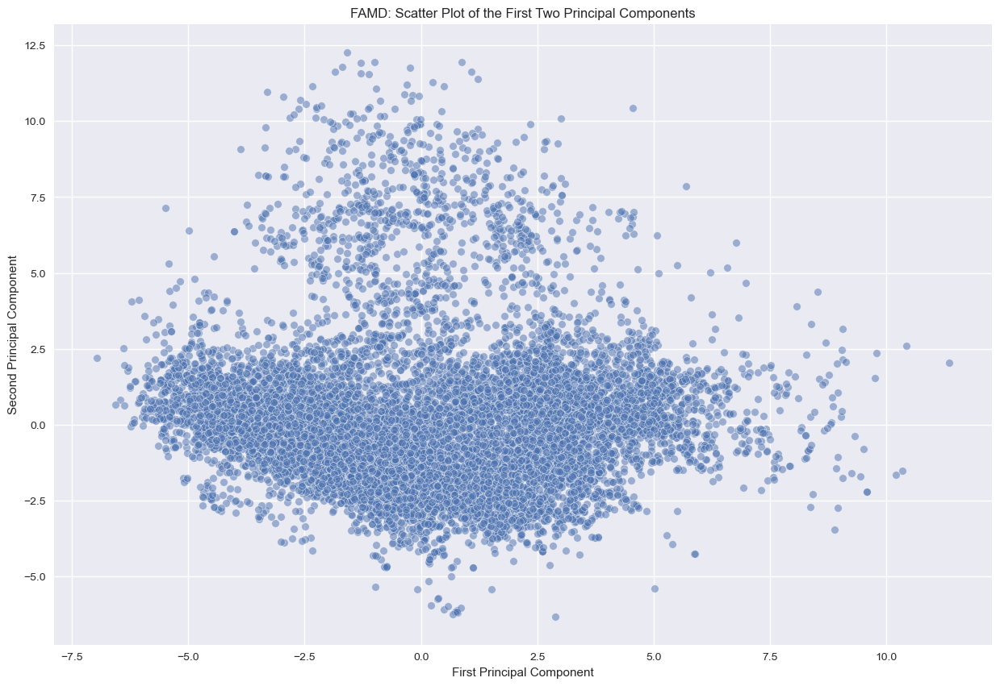

In [40]:
import prince  # FAMD is part of the prince package

# Assuming your data is in DataFrames named 'Xdata' and 'Ydata'
# Xdata = pd.read_csv('Xdata.csv')  # Load your feature data
# Ydata = pd.read_csv('Ydata.csv')  # Load your target variable data

# Initialize the FAMD object
# n_components is the number of components you want to keep
famd = prince.FAMD(n_components=5, n_iter=3, copy=True, check_input=True, engine='sklearn', random_state=42)

# Fit FAMD on your data
famd = famd.fit(Xpca)

# Transform the data (this will give you the coordinates of each sample on the new axes)
X_famd = famd.transform(Xpca)

# Create a scatter plot of the first two principal components
plt.figure(figsize=(15, 10))
sns.scatterplot(x=X_famd[0], y=X_famd[1], alpha=0.5)

plt.title('FAMD: Scatter Plot of the First Two Principal Components')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()

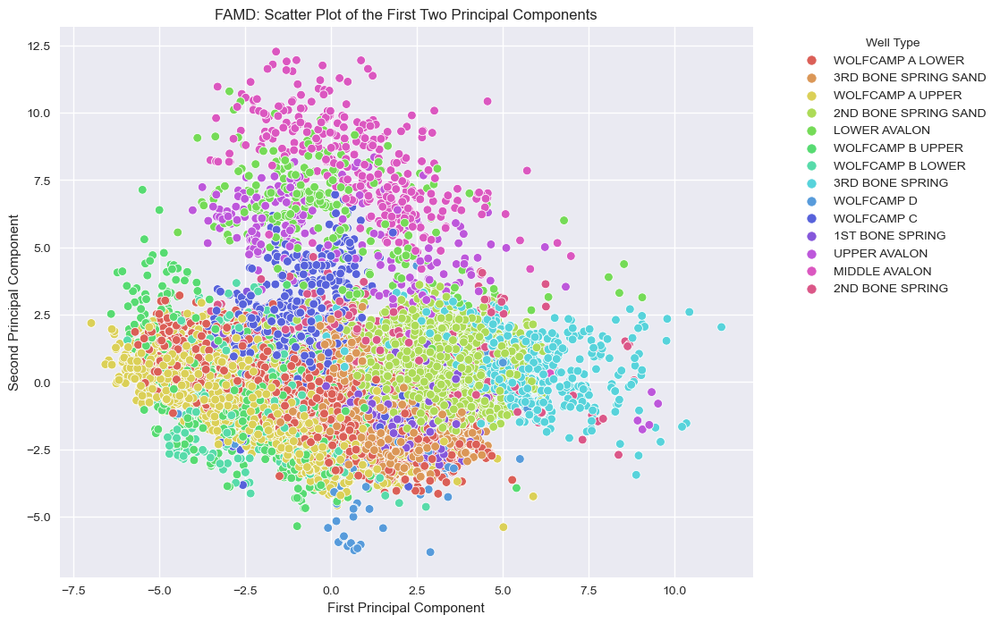

In [41]:
X_famd['Interval Type'] = Xpca['ENVInterval']

# Plotting the first two principal components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=X_famd['Interval Type'], palette='hls')

plt.title('FAMD: Scatter Plot of the First Two Principal Components')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.legend(title='Well Type', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

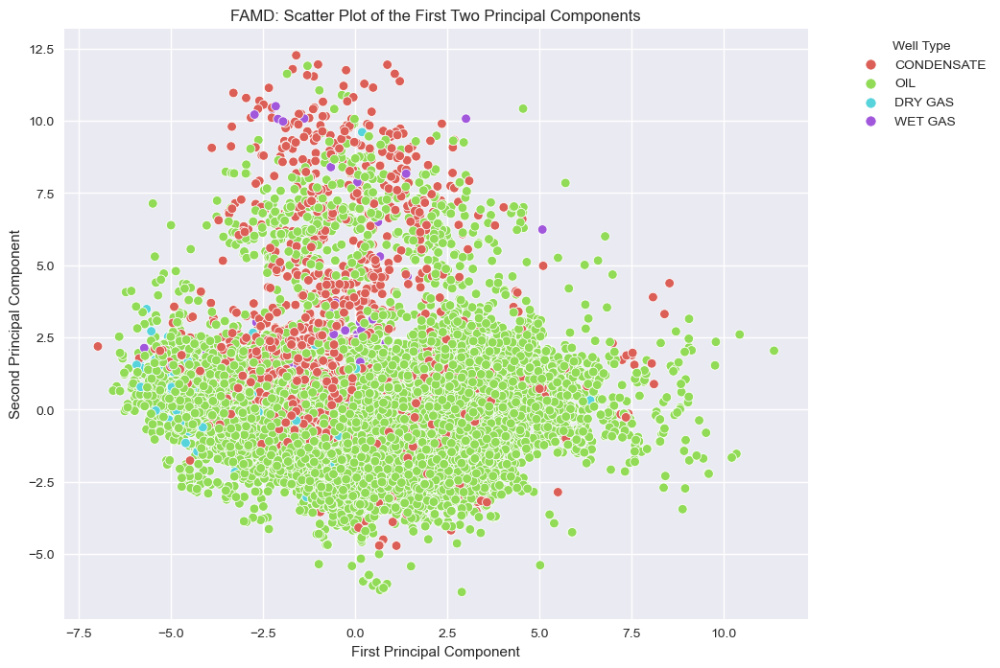

In [42]:
X_famd['Well Type'] = Xpca['ENVProdWellType']

# Plotting the first two principal components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=X_famd['Well Type'], palette='hls')

plt.title('FAMD: Scatter Plot of the First Two Principal Components')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.legend(title='Well Type', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

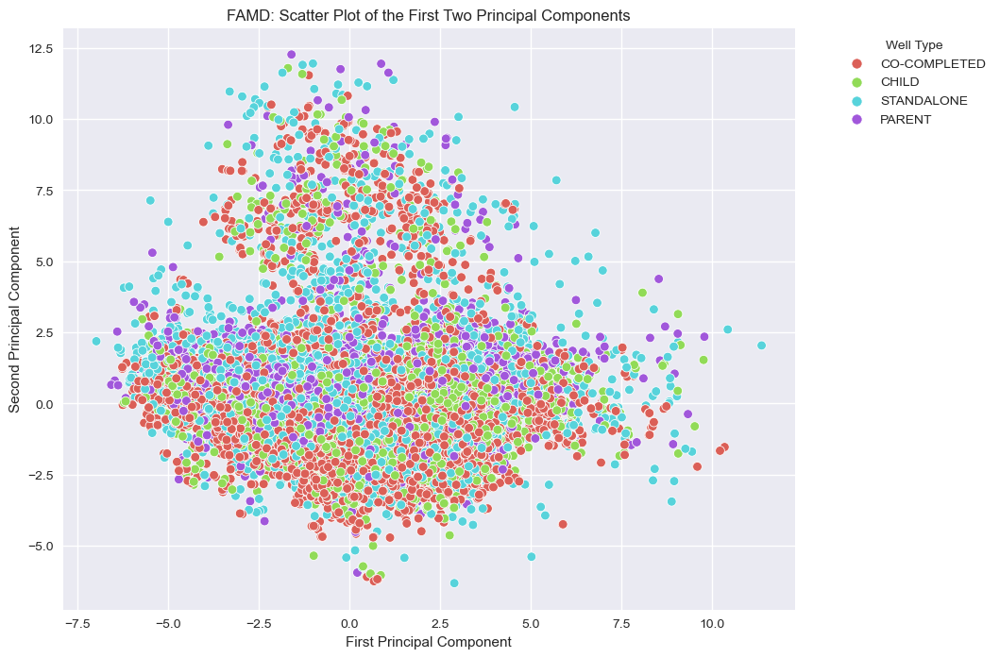

In [43]:
X_famd['Relation Type'] = Xpca['ParentChildSameZone']

# Plotting the first two principal components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=X_famd['Relation Type'], palette='hls')

plt.title('FAMD: Scatter Plot of the First Two Principal Components')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.legend(title='Well Type', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

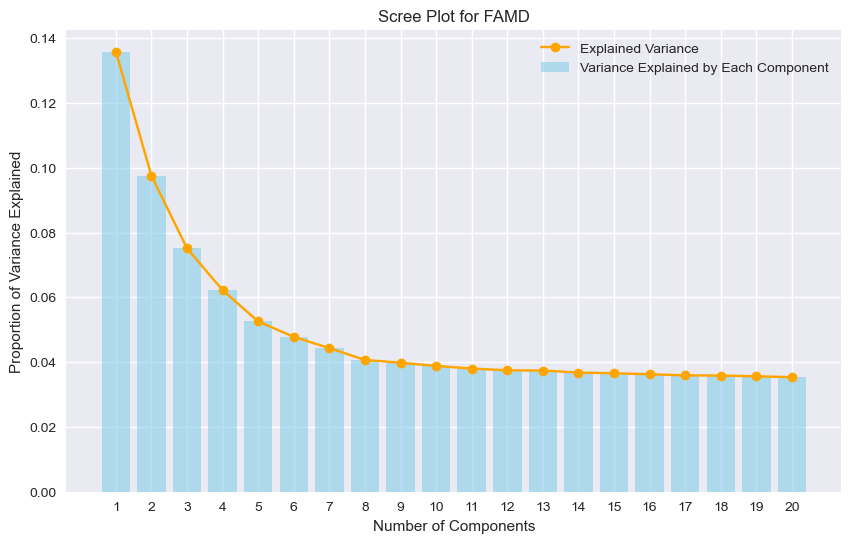

In [44]:
# Initialize the FAMD object with 'sklearn' as the engine
famd = prince.FAMD(n_components=20, n_iter=3, copy=True, check_input=True, engine='sklearn', random_state=42)

# Fit FAMD on your data
famd = famd.fit(Xpca)


# Extracting the eigenvalues
eigenvalues = famd.eigenvalues_

# Total variance
total_variance = sum(eigenvalues)

# Proportion of variance explained by each component
explained_variance = [eigenvalue / total_variance for eigenvalue in eigenvalues]

# Creating the scree plot with both bar and line plots
plt.figure(figsize=(10, 6))

# Bar plot
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.6, color='skyblue', label='Variance Explained by Each Component')

# Line plot
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', color='orange', label='Explained Variance')

plt.title('Scree Plot for FAMD')
plt.xlabel('Number of Components')
plt.ylabel('Proportion of Variance Explained')
plt.xticks(range(1, len(explained_variance) + 1))
plt.grid(True)
plt.legend()
plt.show()

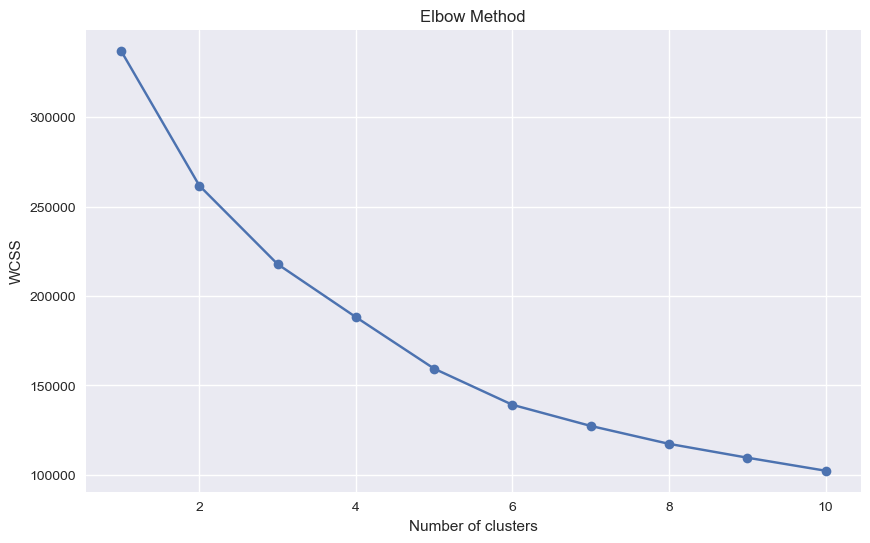

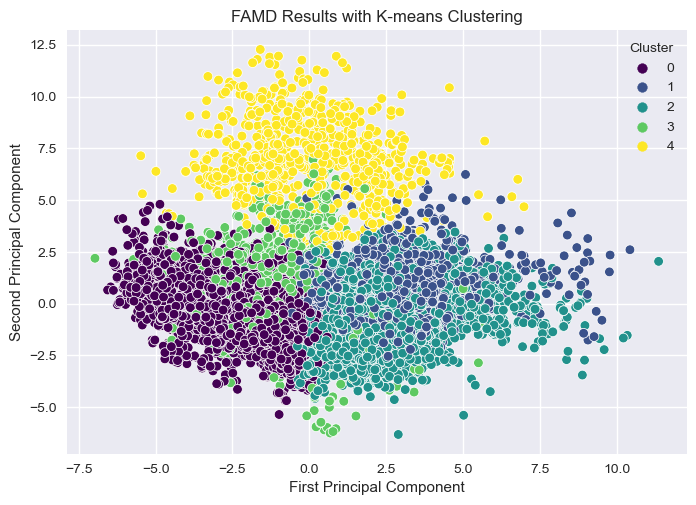

In [45]:
import pandas as pd
import prince
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your data is in a DataFrame named 'Xdata'
# Xdata = pd.read_csv('Xdata.csv')  # Load your feature data

# Initialize and fit FAMD
famd = prince.FAMD(n_components=5, n_iter=3, copy=True, check_input=True, engine='sklearn', random_state=42)
famd = famd.fit(Xpca)
X_famd = famd.transform(Xpca)

# Determine the number of clusters (k)
# This is an example using the Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_famd)
    wcss.append(kmeans.inertia_)

# Plotting the results of the Elbow Method
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# Apply K-means clustering using the determined number of clusters
k = 5 
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
clusters = kmeans.fit_predict(X_famd)

# Adding cluster information to the FAMD results
X_famd['Cluster'] = clusters

# Plotting the clusters
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=X_famd['Cluster'], palette='viridis')
plt.title('FAMD Results with K-means Clustering')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.legend(title='Cluster')
plt.show()

### Kmeans Clustering

In [50]:
Xkdata=Xpca.loc[:,:]
Ygas=wells_data[['GasEURWH_BCF']]
Yoil=wells_data[['OilEURWH_MBBL']]
Ymboe=wells_data[['EURWH_MBOE']]
# Identify numerical and categorical columns
numerical_cols = Xkdata.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = Xkdata.select_dtypes(include=['object', 'category']).columns

# Create a column transformer with OneHotEncoder for categorical data and StandardScaler for numerical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ])

# Create a KMeans instance
kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust the number of clusters as needed

# Create a pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('clusterer', kmeans)])

# Fit the pipeline to your data
pipeline.fit(Xkdata)

# Get cluster labels
cluster_labels = pipeline.named_steps['clusterer'].labels_

# Add cluster information to the dataset
Xkdata['Cluster'] = cluster_labels
# Add Oil EUR data to the dataset for analysis
Xkdata['Oil EUR'] = Yoil['OilEURWH_MBBL']
Xkdata['Gas EUR'] = Ygas['GasEURWH_BCF']
Xkdata['BOE EUR'] = Ymboe['EURWH_MBOE']


# Analyzing how Oil EUR varies across different clusters
cluster_analysis = Xkdata.groupby('Cluster')['Oil EUR'].mean()  # or median, etc.

print(cluster_analysis)

Cluster
0    345.657078
1    377.702938
2    658.434164
3    664.237802
4    624.356515
Name: Oil EUR, dtype: float64


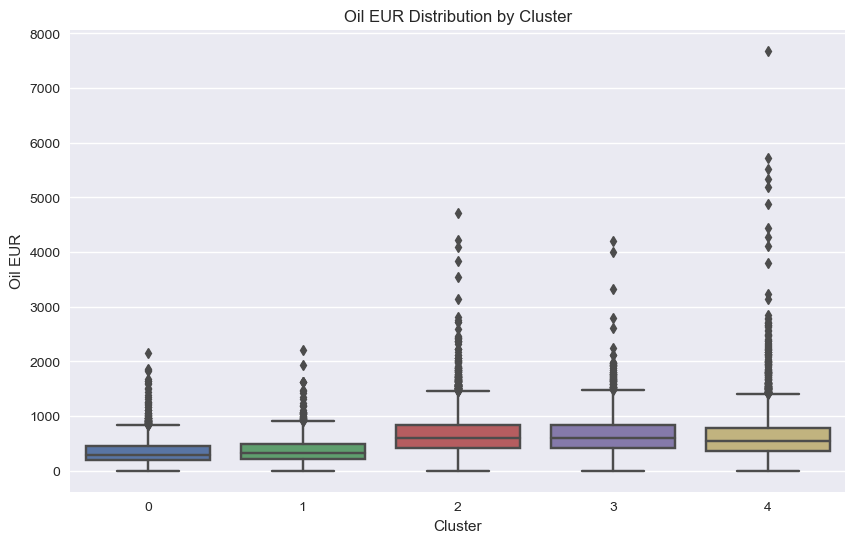

In [51]:
# Boxplot to visualize Oil EUR distribution across clusters
plt.figure(figsize=(10, 6))
sns.boxplot(x='Cluster', y='Oil EUR', data=Xkdata)
plt.title('Oil EUR Distribution by Cluster')
plt.show()

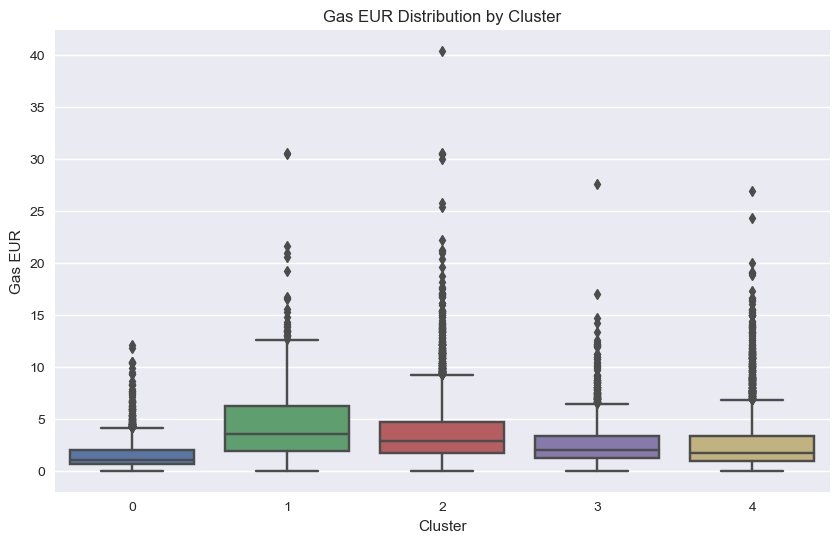

In [52]:
# Boxplot to visualize Oil EUR distribution across clusters
plt.figure(figsize=(10, 6))
sns.boxplot(x='Cluster', y='Gas EUR', data=Xkdata)
plt.title('Gas EUR Distribution by Cluster')
plt.show()

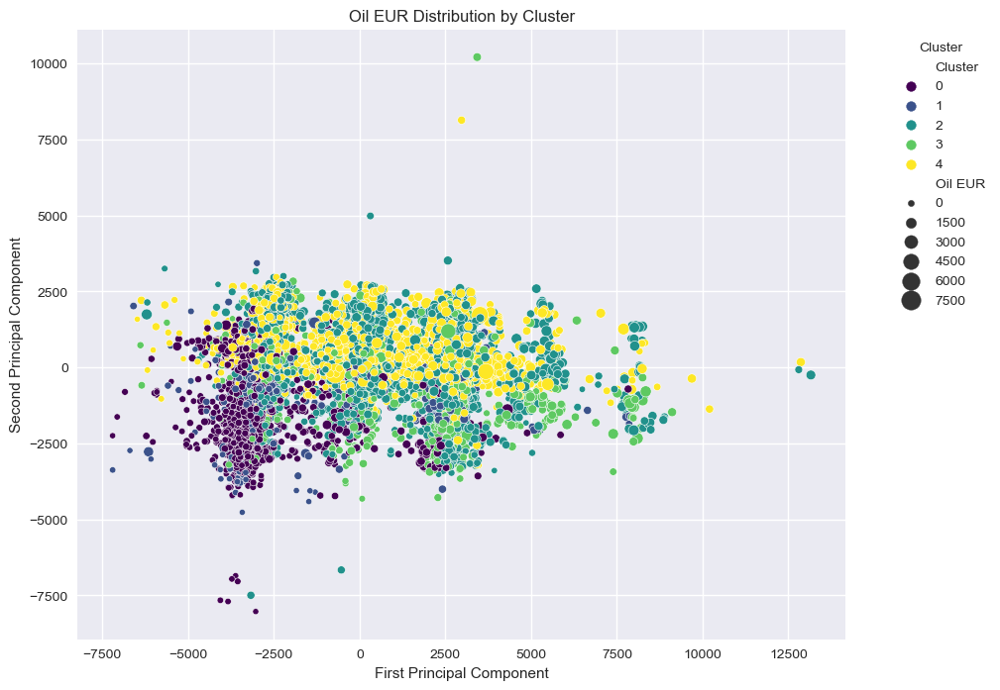

In [53]:
from sklearn.decomposition import PCA

# Apply PCA if not already done
pca = PCA(n_components=2)
X_pca = pca.fit_transform(Xkdata[numerical_cols])  # Assuming 'numerical_cols' are your numerical features

# Add PCA results to the dataset
Xkdata['PCA1'] = X_pca[:, 0]
Xkdata['PCA2'] = X_pca[:, 1]

# Scatter plot to visualize Oil EUR distribution across clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', size='Oil EUR', sizes=(20, 200), data=Xkdata, palette='viridis')

plt.title('Oil EUR Distribution by Cluster')
plt.xlabel('First Principal Component' if 'PCA1' in Xkdata else 'Feature 1')
plt.ylabel('Second Principal Component' if 'PCA2' in Xkdata else 'Feature 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

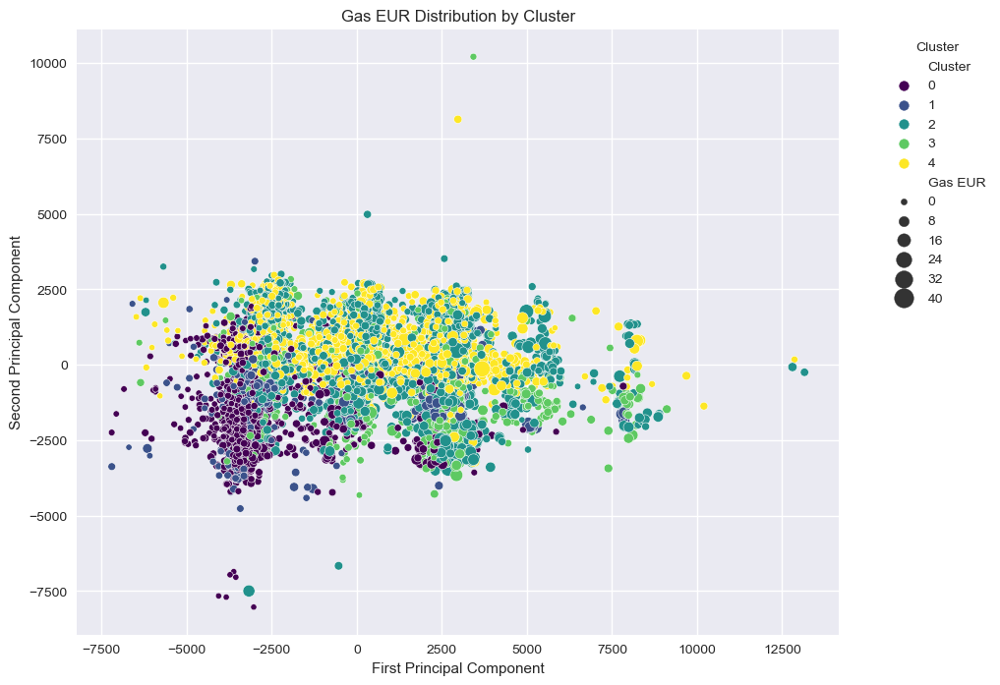

In [54]:
from sklearn.decomposition import PCA

# Apply PCA if not already done
pca = PCA(n_components=2)
X_pca = pca.fit_transform(Xkdata[numerical_cols])  # Assuming 'numerical_cols' are your numerical features

# Add PCA results to the dataset
Xkdata['PCA1'] = X_pca[:, 0]
Xkdata['PCA2'] = X_pca[:, 1]

# Scatter plot to visualize Oil EUR distribution across clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', size='Gas EUR', sizes=(20, 200), data=Xkdata, palette='viridis')

plt.title('Gas EUR Distribution by Cluster')
plt.xlabel('First Principal Component' if 'PCA1' in Xkdata else 'Feature 1')
plt.ylabel('Second Principal Component' if 'PCA2' in Xkdata else 'Feature 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

### K-Prototype Clustering

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 2543, ncost: 71017998254.03407
Run: 1, iteration: 2/100, moves: 2216, ncost: 57581172472.60286
Run: 1, iteration: 3/100, moves: 473, ncost: 57443681847.849525
Run: 1, iteration: 4/100, moves: 40, ncost: 57442279647.30949
Run: 1, iteration: 5/100, moves: 2, ncost: 57442266711.62023
Run: 1, iteration: 6/100, moves: 0, ncost: 57442266711.62023
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 3916, ncost: 57175161446.81001
Run: 2, iteration: 2/100, moves: 1775, ncost: 53987079727.781494
Run: 2, iteration: 3/100, moves: 1266, ncost: 52195252175.50389
Run: 2, iteration: 4/100, moves: 533, ncost: 51902377914.046936
Run: 2, iteration: 5/100, moves: 261, ncost: 51839108051.23737
Run: 2, iteration: 6/100, moves: 145, ncost: 51810220654.27539
Run: 

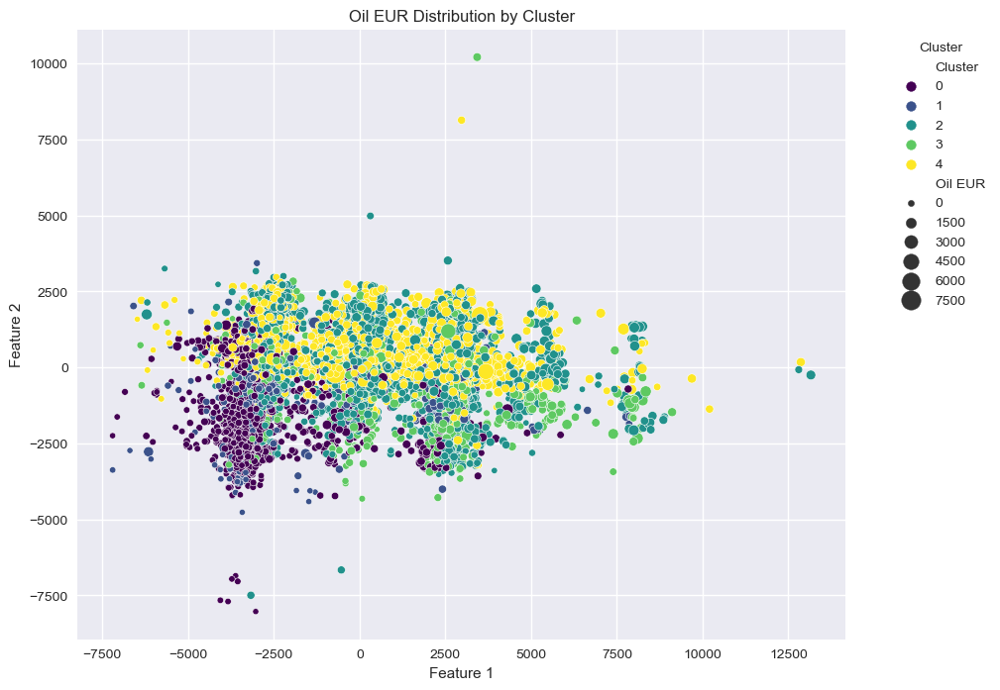

In [58]:
Xkprodata=Xpca.loc[:,:]
Ygas=wells_data[['GasEURWH_BCF']]
Yoil=wells_data[['OilEURWH_MBBL']]
Ymboe=wells_data[['EURWH_MBOE']]
# Identify numerical and categorical columns
numerical_cols = Xkprodata.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = Xkprodata.select_dtypes(include=['object', 'category']).columns

# Create a KPrototypes model
kproto = KPrototypes(n_clusters=5, init='Cao', n_init=5, verbose=1, random_state=42)

# Fit the model
clusters = kproto.fit_predict(Xkdata, categorical=[Xkdata.columns.get_loc(c) for c in categorical_cols])

# Add cluster information to the dataset
Xkprodata['Cluster'] = cluster_labels

# Add Oil EUR data to the dataset for analysis
Xkprodata['Oil EUR'] = Yoil['OilEURWH_MBBL']
Xkprodata['Gas EUR'] = Ygas['GasEURWH_BCF']
Xkprodata['BOE EUR'] = Ymboe['EURWH_MBOE']


# Analyzing how Oil EUR varies across different clusters
cluster_analysis = Xkprodata.groupby('Cluster')['Oil EUR'].mean()  # or median, etc.

print(cluster_analysis)

# Apply PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(Xkprodata[numerical_cols])  # Assuming 'numerical_cols' are your numerical features

# Add PCA results to the dataset
Xkdata['PCA1'] = X_pca[:, 0]
Xkdata['PCA2'] = X_pca[:, 1]

# Scatter plot to visualize Oil EUR distribution across clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', size='Oil EUR', sizes=(20, 200), data=Xkdata, palette='viridis')

plt.title('Oil EUR Distribution by Cluster')
plt.xlabel('First Principal Component' if 'PCA1' in Xkprodata else 'Feature 1')
plt.ylabel('Second Principal Component' if 'PCA2' in Xkprodata else 'Feature 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

### PCA and Clustering using Factor Analysis of Mixed Data 

Cluster
0    654.181971
1    354.578473
2    682.148861
3    395.621349
4    377.537332
Name: Oil EUR, dtype: float64


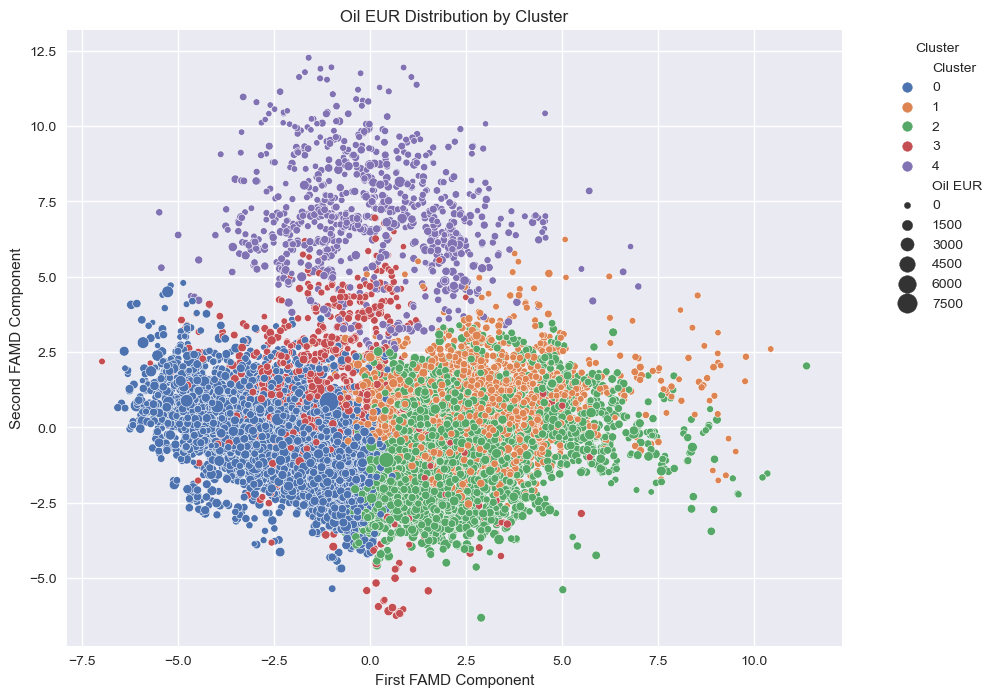

In [59]:
Xfdata=Xpca.loc[:,:]
Ygas=wells_data[['GasEURWH_BCF']]
Yoil=wells_data[['OilEURWH_MBBL']]
Ymboe=wells_data[['EURWH_MBOE']]

# Initialize and fit FAMD
famd = prince.FAMD(n_components=5, n_iter=3, random_state=42)
X_famd = famd.fit_transform(Xfdata)

# Apply K-means clustering on the FAMD results
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(X_famd)

# Add the cluster to your dataset
Xfdata['Cluster'] = clusters

# Add Oil EUR data to the dataset for analysis
Xfdata['Oil EUR'] = Yoil['OilEURWH_MBBL']
Xfdata['Gas EUR'] = Ygas['GasEURWH_BCF']
Xfdata['BOE EUR'] = Ymboe['EURWH_MBOE']

# Analyzing how Oil EUR varies across different clusters
cluster_analysis = Xfdata.groupby('Cluster')['Oil EUR'].mean()  # or median, etc.
print(cluster_analysis)

# Scatter plot to visualize Oil EUR distribution across FAMD components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=Xfdata['Cluster'], size=Xfdata['Oil EUR'], sizes=(20, 200), palette='deep')

plt.title('Oil EUR Distribution by Cluster')
plt.xlabel('First FAMD Component')
plt.ylabel('Second FAMD Component')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

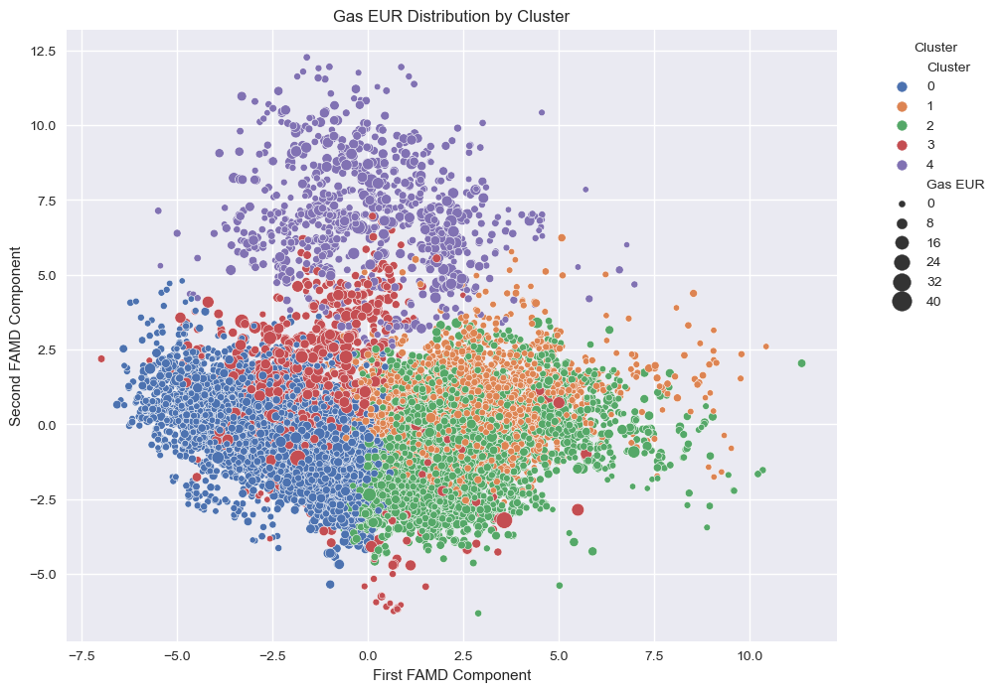

In [60]:
# Scatter plot to visualize Oil EUR distribution across FAMD components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=Xfdata['Cluster'], size=Xfdata['Gas EUR'], sizes=(20, 200), palette='deep')

plt.title('Gas EUR Distribution by Cluster')
plt.xlabel('First FAMD Component')
plt.ylabel('Second FAMD Component')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

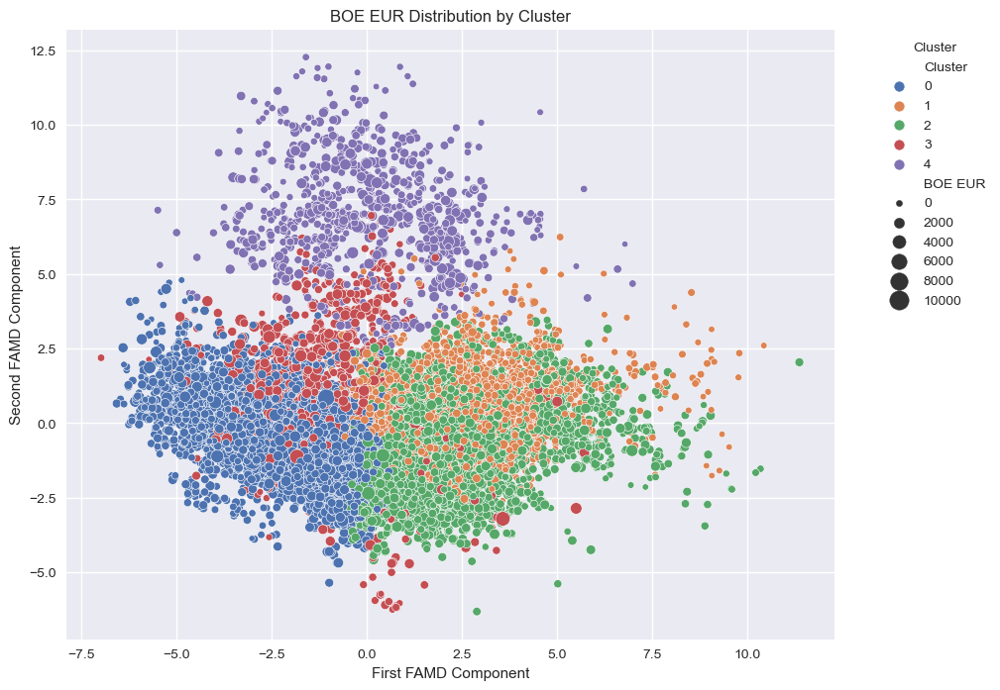

In [61]:
# Scatter plot to visualize Oil EUR distribution across FAMD components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=Xfdata['Cluster'], size=Xfdata['BOE EUR'], sizes=(20, 200), palette='deep')

plt.title('BOE EUR Distribution by Cluster')
plt.xlabel('First FAMD Component')
plt.ylabel('Second FAMD Component')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

### GMM clustering

In [62]:
from sklearn.mixture import GaussianMixture

Xgmmdata=Xpca.loc[:,:]
Ygas=wells_data[['GasEURWH_BCF']]
Yoil=wells_data[['OilEURWH_MBBL']]
Ymboe=wells_data[['EURWH_MBOE']]

famd = prince.FAMD(n_components=5, n_iter=3, random_state=42)
X_famd = famd.fit_transform(Xgmmdata)

# Apply GMM clustering on the FAMD results
gmm = GaussianMixture(n_components=5, random_state=42)
gmm.fit(X_famd)
clusters = gmm.predict(X_famd)

# Add the cluster to your dataset
Xgmmdata['Cluster'] = clusters

# Add Oil EUR data to the dataset for analysis
Xgmmdata['Oil EUR'] = Yoil['OilEURWH_MBBL']
Xgmmdata['Gas EUR'] = Ygas['GasEURWH_BCF']
Xgmmdata['BOE EUR'] = Ymboe['EURWH_MBOE']


# Analyzing how Oil EUR varies across different clusters
cluster_analysis = Xgmmdata.groupby('Cluster')['Oil EUR'].mean()  # or median, etc.
print(cluster_analysis)

Cluster
0    640.928037
1    509.326485
2    378.204225
3    694.137609
4    336.544478
Name: Oil EUR, dtype: float64


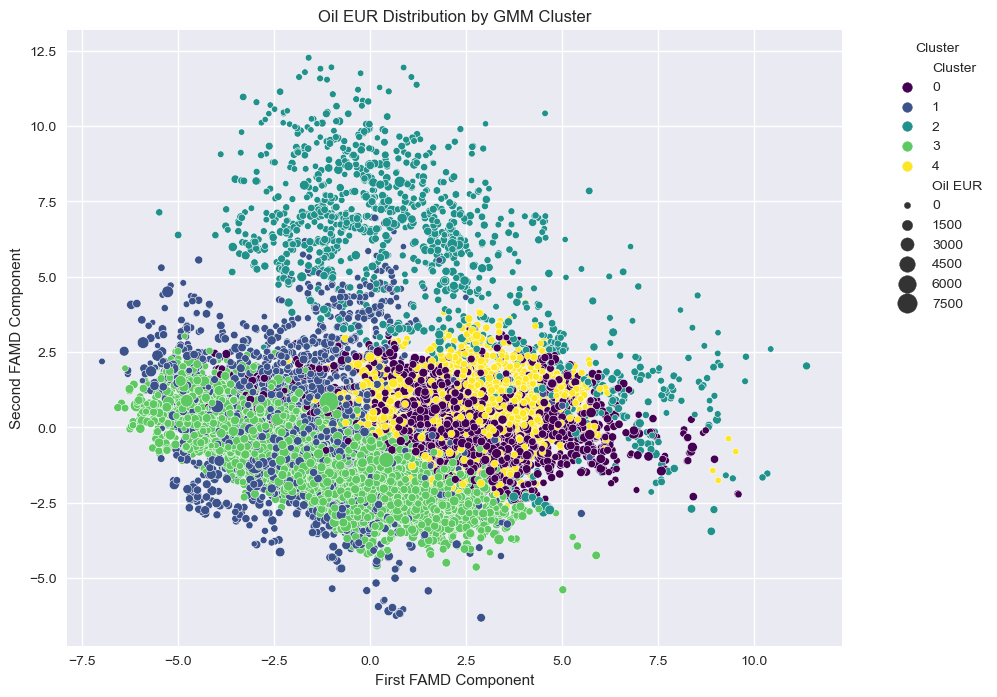

In [63]:
# Scatter plot to visualize Oil EUR distribution across FAMD components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=Xgmmdata['Cluster'], size=Xgmmdata['Oil EUR'], sizes=(20, 200), palette='viridis')

plt.title('Oil EUR Distribution by GMM Cluster')
plt.xlabel('First FAMD Component')
plt.ylabel('Second FAMD Component')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

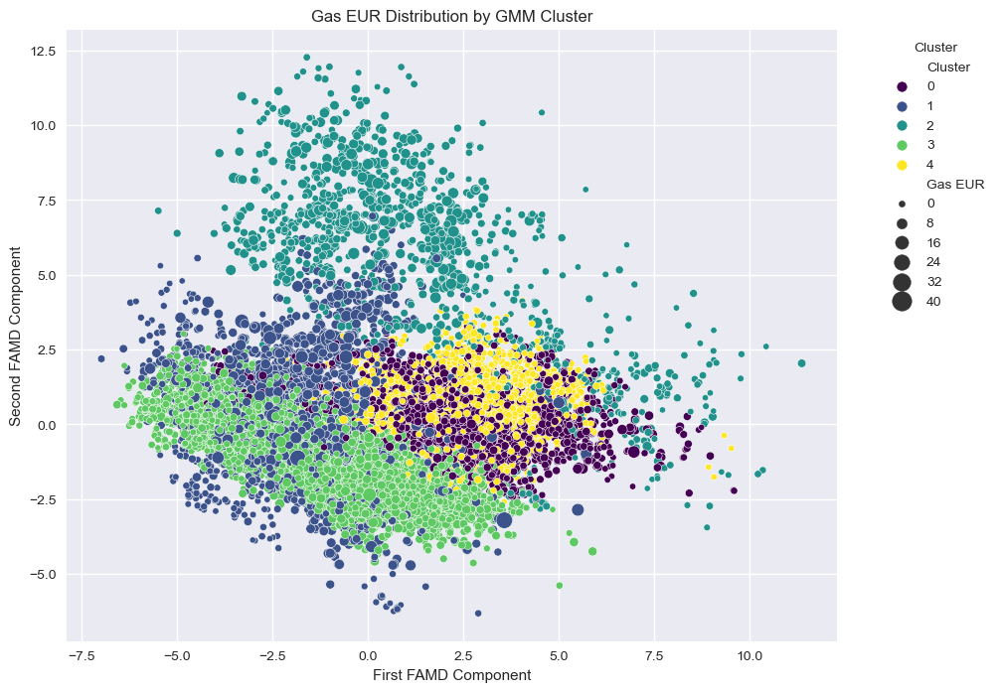

In [64]:
# Scatter plot to visualize Oil EUR distribution across FAMD components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=Xgmmdata['Cluster'], size=Xgmmdata['Gas EUR'], sizes=(20, 200), palette='viridis')

plt.title('Gas EUR Distribution by GMM Cluster')
plt.xlabel('First FAMD Component')
plt.ylabel('Second FAMD Component')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

In [65]:
wells_data['ParentChildSameZone'].value_counts()

ParentChildSameZone
CO-COMPLETED    6133
STANDALONE      3220
CHILD           2995
PARENT          2077
Name: count, dtype: int64

In [66]:
wells_data.columns

Index(['ENVProdWellType', 'ENVInterval', 'Latitude', 'Longitude', 'TVD_FT',
       'Vintage', 'LateralLength_FT', 'ProppantIntensity_LBSPerFT',
       'FluidIntensity_BBLPerFT', 'ParentChildSameZone',
       'WellsPerSectionSameZone', 'Payzone_FT', 'GammaRay_API',
       'BulkDensity_GPerCC', 'Resistivity_OHMSM', 'DensityPorosity_PCT',
       'EffectivePorosity_PCT', 'ClayVolume_PCT', 'NonClayVolume_PCT',
       'WaterSaturation_PCT', 'PhiH_FT', 'HCPV_PCT', 'HeightOfHCPV_FT',
       'TotalOrganicCarbon_WTPCT', 'EURWH_MBOE', 'OilEURWH_MBBL',
       'GasEURWH_BCF', 'size_'],
      dtype='object')

### GMM Clustering on rock type filter

In [67]:
wells_data_rock=wells_data[wells_data['ENVInterval']=='WOLFCAMP A LOWER']
wells_data_rock.shape

(2918, 28)

In [68]:
Xrock= wells_data_rock.drop(columns=['EURWH_MBOE', 'OilEURWH_MBBL',
       'GasEURWH_BCF'])
Ygas=wells_data[['GasEURWH_BCF']]
Yoil=wells_data[['OilEURWH_MBBL']]
Ymboe=wells_data[['EURWH_MBOE']]

famd = prince.FAMD(n_components=20, n_iter=3, random_state=42)
X_famd = famd.fit_transform(Xrock)

# Apply GMM clustering on the FAMD results
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(X_famd)
clusters = gmm.predict(X_famd)

# Add the cluster to your dataset
Xrock['Cluster'] = clusters

# Add Oil EUR data to the dataset for analysis
Xrock['Oil EUR'] = Yoil['OilEURWH_MBBL']
Xrock['Gas EUR'] = Ygas['GasEURWH_BCF']
Xrock['BOE EUR'] = Ymboe['EURWH_MBOE']


# Analyzing how Oil EUR varies across different clusters
cluster_analysis = Xrock.groupby('Cluster')['Oil EUR'].mean()  # or median, etc.
print(cluster_analysis)

Cluster
0    540.424955
1    670.109937
Name: Oil EUR, dtype: float64


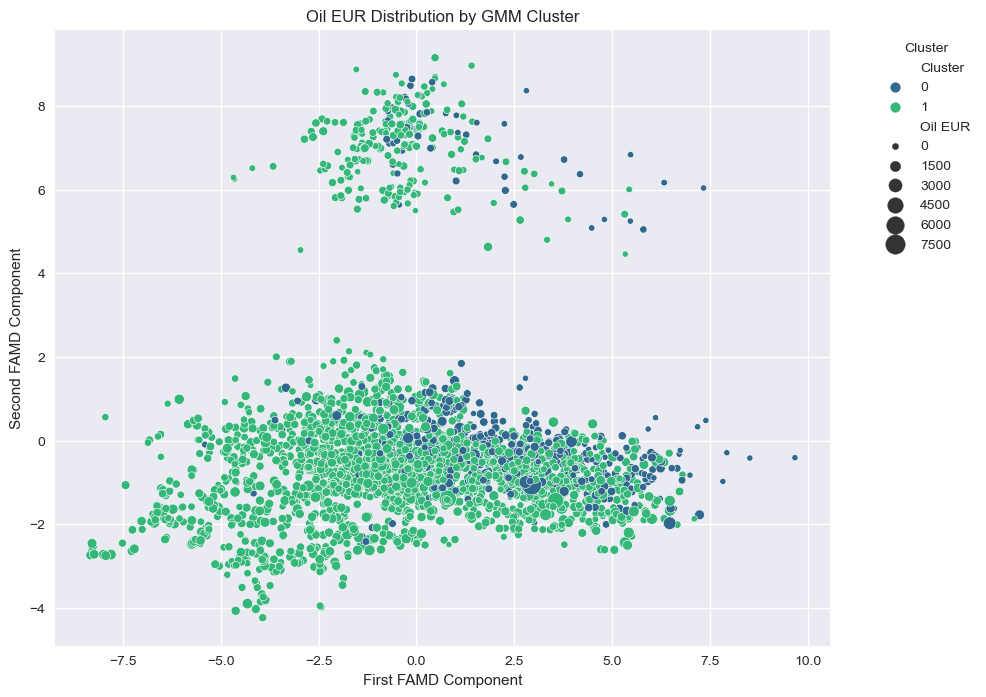

In [69]:
# Scatter plot to visualize Oil EUR distribution across FAMD components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=Xrock['Cluster'], size=Xrock['Oil EUR'], sizes=(20, 200), palette='viridis')

plt.title('Oil EUR Distribution by GMM Cluster')
plt.xlabel('First FAMD Component')
plt.ylabel('Second FAMD Component')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

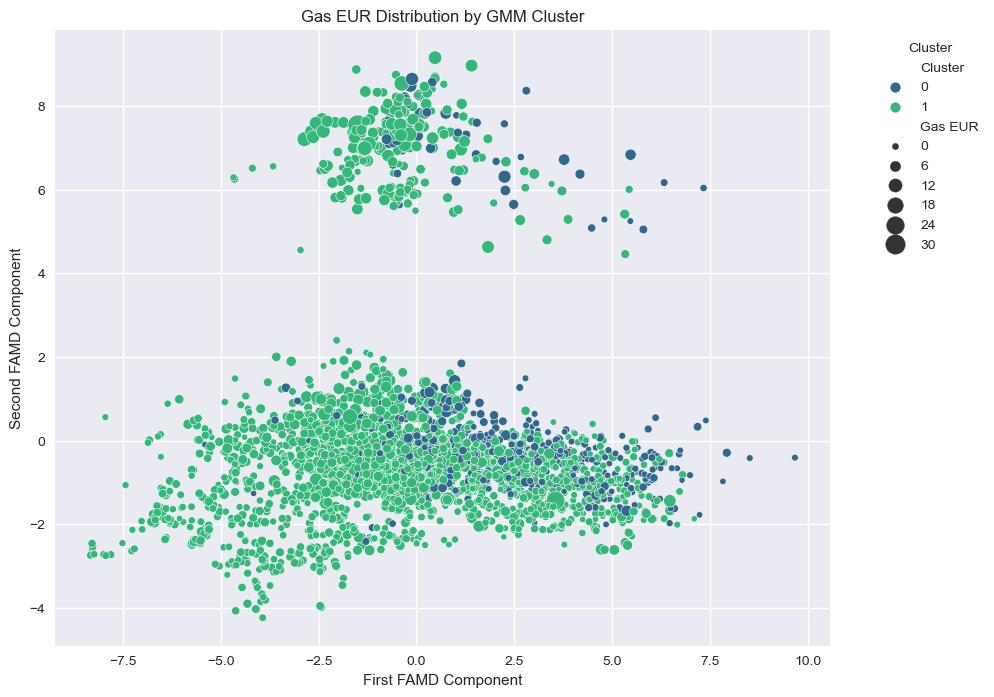

In [70]:
# Scatter plot to visualize Oil EUR distribution across FAMD components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=Xrock['Cluster'], size=Xrock['Gas EUR'], sizes=(20, 200), palette='viridis')

plt.title('Gas EUR Distribution by GMM Cluster')
plt.xlabel('First FAMD Component')
plt.ylabel('Second FAMD Component')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

### Kmean Clustering on rock type filter

In [71]:
Xkrock= wells_data_rock.drop(columns=['EURWH_MBOE', 'OilEURWH_MBBL',
       'GasEURWH_BCF'])
Ygas=wells_data[['GasEURWH_BCF']]
Yoil=wells_data[['OilEURWH_MBBL']]
Ymboe=wells_data[['EURWH_MBOE']]

famd = prince.FAMD(n_components=20, n_iter=3, random_state=42)
X_famd = famd.fit_transform(Xkrock)

# Apply K-means clustering on the FAMD results
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(X_famd)

# Add the cluster to your dataset
Xkrock['Cluster'] = clusters

# Add Oil EUR data to the dataset for analysis
Xkrock['Oil EUR'] = Yoil['OilEURWH_MBBL']
Xkrock['Gas EUR'] = Ygas['GasEURWH_BCF']
Xkrock['BOE EUR'] = Ymboe['EURWH_MBOE']


# Analyzing how Oil EUR varies across different clusters
cluster_analysis = Xkrock.groupby('Cluster')['Oil EUR'].mean()  # or median, etc.
print(cluster_analysis)

Cluster
0    627.431873
1    659.193025
Name: Oil EUR, dtype: float64


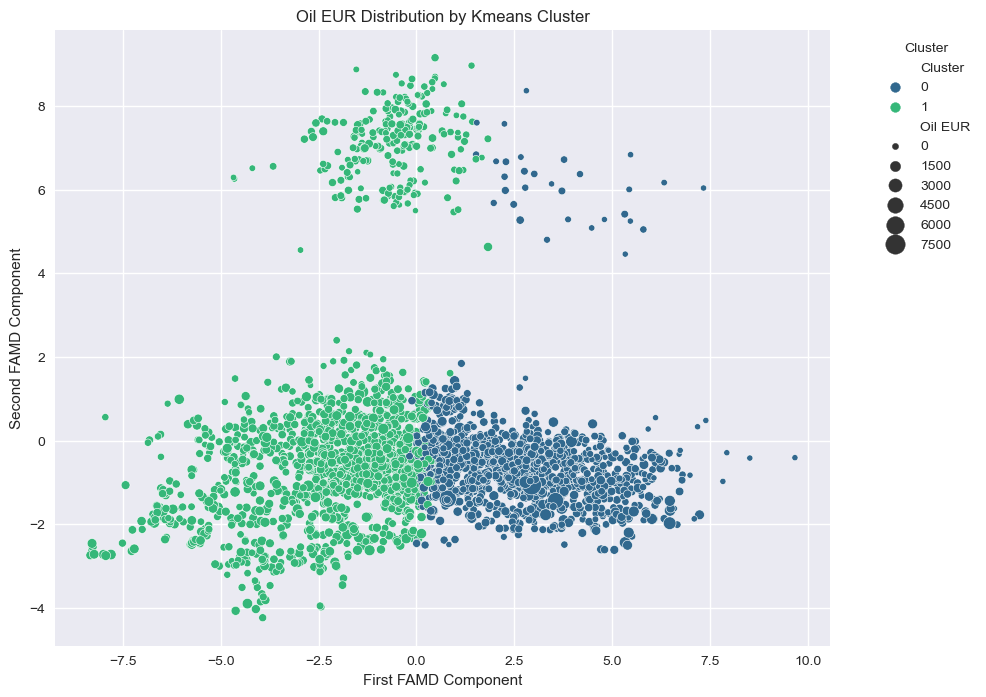

In [72]:
# Scatter plot to visualize Oil EUR distribution across FAMD components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=Xkrock['Cluster'], size=Xkrock['Oil EUR'], sizes=(20, 200), palette='viridis')

plt.title('Oil EUR Distribution by Kmeans Cluster')
plt.xlabel('First FAMD Component')
plt.ylabel('Second FAMD Component')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

In [73]:
wells_data['ParentChildSameZone'].unique()

array(['CO-COMPLETED', 'CHILD', 'STANDALONE', 'PARENT'], dtype=object)

In [74]:
wells_data_relat=wells_data[wells_data['ParentChildSameZone']=='PARENT']
wells_data_relat.shape

(2077, 28)

### Clustering on Well relation

In [75]:
Xrelat= wells_data_relat.drop(columns=['EURWH_MBOE', 'OilEURWH_MBBL',
       'GasEURWH_BCF'])
Ygas=wells_data[['GasEURWH_BCF']]
Yoil=wells_data[['OilEURWH_MBBL']]
Ymboe=wells_data[['EURWH_MBOE']]

famd = prince.FAMD(n_components=20, n_iter=3, random_state=42)
X_famd = famd.fit_transform(Xrelat)

# Apply GMM clustering on the FAMD results
gmm = GaussianMixture(n_components=3, random_state=42)
gmm.fit(X_famd)
clusters = gmm.predict(X_famd)

# Add the cluster to your dataset
Xrelat['Cluster'] = clusters

# Add Oil EUR data to the dataset for analysis
Xrelat['Oil EUR'] = Yoil['OilEURWH_MBBL']
Xrelat['Gas EUR'] = Ygas['GasEURWH_BCF']
Xrelat['BOE EUR'] = Ymboe['EURWH_MBOE']


# Analyzing how Oil EUR varies across different clusters
cluster_analysis = Xrelat.groupby('Cluster')['Oil EUR'].mean()  # or median, etc.
print(cluster_analysis)

Cluster
0    670.944056
1    468.941886
2      0.000000
Name: Oil EUR, dtype: float64


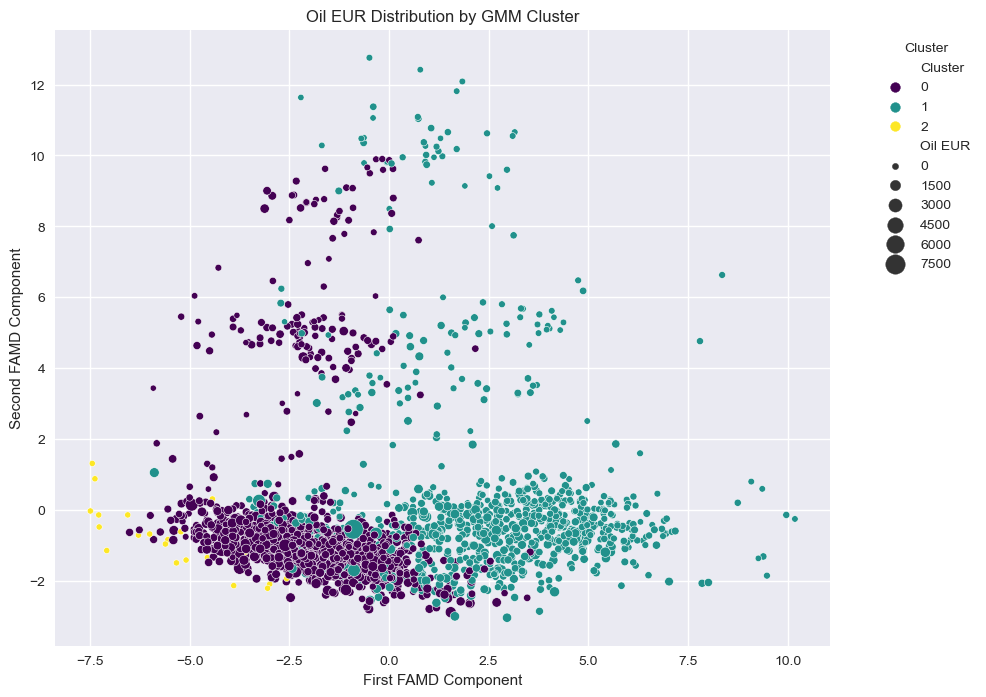

In [76]:
# Scatter plot to visualize Oil EUR distribution across FAMD components
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_famd[0], y=X_famd[1], hue=Xrelat['Cluster'], size=Xrelat['Oil EUR'], sizes=(20, 200), palette='viridis')

plt.title('Oil EUR Distribution by GMM Cluster')
plt.xlabel('First FAMD Component')
plt.ylabel('Second FAMD Component')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

### Linear Regression

In [111]:
wells_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14425 entries, 0 to 16684
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ENVProdWellType             14425 non-null  object 
 1   ENVInterval                 14425 non-null  object 
 2   Latitude                    14425 non-null  float64
 3   Longitude                   14425 non-null  float64
 4   TVD_FT                      14425 non-null  float64
 5   Vintage                     14425 non-null  int64  
 6   LateralLength_FT            14425 non-null  float64
 7   ProppantIntensity_LBSPerFT  14425 non-null  float64
 8   FluidIntensity_BBLPerFT     14425 non-null  float64
 9   ParentChildSameZone         14425 non-null  object 
 10  WellsPerSectionSameZone     14425 non-null  float64
 11  Payzone_FT                  14425 non-null  float64
 12  GammaRay_API                14425 non-null  float64
 13  BulkDensity_GPerCC          14425 no

### Linear Rgegresion

In [113]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score

Y = wells_data[['OilEURWH_MBBL']]
X= wells_data.drop(columns=['EURWH_MBOE', 'OilEURWH_MBBL',
       'GasEURWH_BCF'])

# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns

# Create a column transformer with OneHotEncoder for categorical data and StandardScaler for numerical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ])

# Create a linear regression model
model = Pipeline(steps=[('preprocessor', preprocessor), ('regressor', LinearRegression())])

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# create pipeline
#pipe = Pipeline(
#    [("scaler", StandardScaler()), ("model", LinearRegression())]
#)

# fit model
#pipe.fit(X_train, Y_train)

# Fit the model
model.fit(X_train, Y_train)

# Make predictions
Y_pred = model.predict(X_test)

# Calculate metrics
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

Mean Squared Error: 98601.28427604519
R^2 Score: 0.3458775018682546


### Ridge Regression

In [120]:
from sklearn.linear_model import Ridge

# Define the pipeline with Ridge regression
ridge_model = Pipeline(steps=[('preprocessor', preprocessor),
                              ('regressor', Ridge(alpha=0.01, random_state=42))])
ridge_model.fit(X_train, Y_train)
Y_pred_ridge = ridge_model.predict(X_test)

mse_ridge = mean_squared_error(Y_test, Y_pred_ridge)
r2_ridge = r2_score(Y_test, Y_pred_ridge)

print(f'Ridge Regression - Mean Squared Error: {mse_ridge}')
print(f'Ridge Regression - R^2 Score: {r2_ridge}')

Ridge Regression - Mean Squared Error: 98601.32409253216
Ridge Regression - R^2 Score: 0.34587723772504275


### Lasso Regression

In [121]:
from sklearn.linear_model import Lasso

# Define the pipeline with Lasso regression
lasso_model = Pipeline(steps=[('preprocessor', preprocessor),
                              ('regressor', Lasso(alpha=0.01, random_state=42))])
lasso_model.fit(X_train, Y_train)
Y_pred_lasso = lasso_model.predict(X_test)

mse_lasso = mean_squared_error(Y_test, Y_pred_lasso)
r2_lasso = r2_score(Y_test, Y_pred_lasso)

print(f'Lasso Regression - Mean Squared Error: {mse_lasso}')
print(f'Lasso Regression - R^2 Score: {r2_lasso}')

Lasso Regression - Mean Squared Error: 98602.34926083665
Lasso Regression - R^2 Score: 0.3458704367421016


### Random Forest

In [123]:
from sklearn.ensemble import RandomForestRegressor
# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns

# Create a column transformer with OneHotEncoder for categorical data and StandardScaler for numerical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ])

# Create a pipeline with a random forest regressor
rf_model = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))])

# Split the dataset into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Fit the model
rf_model.fit(X_train, Y_train.values.ravel())

# Make predictions
Y_pred = rf_model.predict(X_test)

# Calculate metrics
mse_rf = mean_squared_error(Y_test, Y_pred)
r2_rf = r2_score(Y_test, Y_pred)

print(f'Random Forest - Mean Squared Error: {mse_rf}')
print(f'Random Forest - R^2 Score: {r2_rf}')

Random Forest - Mean Squared Error: 81238.83600287694
Random Forest - R^2 Score: 0.4610602616214885


### NN

In [124]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Splitting the data into training, validation, and test sets
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, test_size=0.3, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=42)

# Preprocessing
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ])

X_train = preprocessor.fit_transform(X_train)
X_val = preprocessor.transform(X_val)
X_test = preprocessor.transform(X_test)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train.astype(np.float32))
Y_train_tensor = torch.tensor(Y_train.values.astype(np.float32))
X_val_tensor = torch.tensor(X_val.astype(np.float32))
Y_val_tensor = torch.tensor(Y_val.values.astype(np.float32))
X_test_tensor = torch.tensor(X_test.astype(np.float32))
Y_test_tensor = torch.tensor(Y_test.values.astype(np.float32))

# Creating data loaders
train_data = TensorDataset(X_train_tensor, Y_train_tensor)
val_data = TensorDataset(X_val_tensor, Y_val_tensor)

train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=64, shuffle=True)

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(X_train.shape[1], 64)  # Adjust the input size accordingly
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

model = Net()

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 100  # Adjust as necessary
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for data, targets in train_loader:
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, targets)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    # Validation loop
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for data, targets in val_loader:
            output = model(data)
            loss = criterion(output, targets)
            val_loss += loss.item()

    train_loss /= len(train_loader)
    val_loss /= len(val_loader)
    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {train_loss}, Validation Loss: {val_loss}")
    
    model.eval()
with torch.no_grad():
    predictions = model(X_test_tensor)
    test_mse = criterion(predictions, Y_test_tensor).item()
    test_r2 = r2_score(Y_test_tensor.numpy(), predictions.numpy())

print(f'Test MSE: {test_mse}')
print(f'Test R^2 Score: {test_r2}')

Epoch 1/100, Training Loss: 454501.77056962025, Validation Loss: 352725.3432904412
Epoch 2/100, Training Loss: 190522.10047468354, Validation Loss: 133459.48943014705
Epoch 3/100, Training Loss: 119096.01077927215, Validation Loss: 117607.71243106617
Epoch 4/100, Training Loss: 107724.70233386075, Validation Loss: 110688.50896139706
Epoch 5/100, Training Loss: 102572.62836234177, Validation Loss: 107623.89292279411
Epoch 6/100, Training Loss: 100318.62675534018, Validation Loss: 106175.50396369485
Epoch 7/100, Training Loss: 99129.24372033228, Validation Loss: 105025.27849264706
Epoch 8/100, Training Loss: 98305.24547567246, Validation Loss: 105187.18520220589
Epoch 9/100, Training Loss: 97924.62470332278, Validation Loss: 104530.67026654411
Epoch 10/100, Training Loss: 97591.71654964398, Validation Loss: 104020.50287224265
Epoch 11/100, Training Loss: 97303.59827432754, Validation Loss: 103877.04940257352
Epoch 12/100, Training Loss: 97167.96452234968, Validation Loss: 103875.36856617

Epoch 100/100, Training Loss: 89654.83418215982, Validation Loss: 99030.22024356617
Test MSE: 93169.96875
Test R^2 Score: 0.3981415379039587
